# PREDICTING TIME TAKEN TO PAY OFF LOAN

## About Dataset
The dataset includes customers who have paid off their loans, who have been past due and put into collection without paying back their loan and interests, and who have paid off only after they were put in collection. The original dataset contains 113937 rows and 81 columns out of which 12 features of intrest were selected.Eight hundred and seventy-one data points were removed from the analysis due to inconsistencies or missing information.


Dataset source: [here](https://www.kaggle.com/datasets/nurudeenabdulsalaam/prosper-loan-dataset)

In [456]:
# import matplotlib.pyplot as plt
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action="ignore")

from glob import glob #library that helps us search for files
import scipy
import random
from datetime import datetime
from sklearn.inspection import permutation_importance

import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
from category_encoders import OneHotEncoder,TargetEncoder,OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import KFold

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.utils.validation import check_is_fitted
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, FunctionTransformer, PowerTransformer,LabelEncoder, MaxAbsScaler, RobustScaler
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn.compose import ColumnTransformer
import xgboost as xgb
from sklearn.feature_selection import RFE, SelectKBest, f_regression, SelectFromModel
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from scipy.special import inv_boxcox
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE, ADASYN

# metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error


#models
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.linear_model import QuantileRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet
from sklearn.dummy import DummyRegressor

#deep learning model
from sklearn.neural_network import MLPRegressor

from sklearn.neighbors import KNeighborsRegressor
pd.pandas.set_option('display.max_rows',None)
pd.pandas.set_option('display.max_columns',None)
pd.set_option('display.max_colwidth', None)

from sklearn.feature_selection import VarianceThreshold
#pd.options.display.float_format = '{:20,.2f}'.format
from sklearn import set_config
set_config(transform_output = 'pandas')


#saving model
import pickle

In [53]:
path = "C:/Users/Oamen/OneDrive/Documents/DATASETS/ml_datasets_to_do/Loan Payment Time Prediction/prosperLoanData.csv"

In [54]:
df = pd.read_csv(path)

In [55]:
df.shape

(113937, 81)

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   ListingKey                           113937 non-null  object 
 1   ListingNumber                        113937 non-null  int64  
 2   ListingCreationDate                  113937 non-null  object 
 3   CreditGrade                          28953 non-null   object 
 4   Term                                 113937 non-null  int64  
 5   LoanStatus                           113937 non-null  object 
 6   ClosedDate                           55089 non-null   object 
 7   BorrowerAPR                          113912 non-null  float64
 8   BorrowerRate                         113937 non-null  float64
 9   LenderYield                          113937 non-null  float64
 10  EstimatedEffectiveYield              84853 non-null   float64
 11  EstimatedLoss

In [57]:
df[:3]

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,GroupKey,DateCreditPulled,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,LoanKey,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MemberKey,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.158,0.138,NaN,NaN,NaN,NaN,NaN,NaN,0,CO,Other,Self-employed,2.0,True,True,NaN,2007-08-26 18:41:46.780000000,640.0,659.0,2001-10-11 00:00:00,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,"$25,000-49,999",True,3083.333333,E33A3400205839220442E84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,78,19141,9425,2007-09-12 00:00:00,Q3 2007,1F3E3376408759268057EDA,330.43,11396.14,9425.0,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.092,0.082,0.0796,0.0249,0.0547,6.0,A,7.0,2,CO,Professional,Employed,44.0,False,False,NaN,2014-02-27 08:28:14,680.0,699.0,1996-03-18 00:00:00,14.0,14.0,29.0,13,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,"$50,000-74,999",True,6125.000000,9E3B37071505919926B1D82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0,134815,10000,2014-03-03 00:00:00,Q1 2014,1D13370546739025387B2F4,318.93,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.275,0.240,NaN,NaN,NaN,NaN,NaN,NaN,0,GA,Other,Not available,NaN,False,True,783C3371218786870A73D20,2007-01-02 14:09:10.060000000,480.0,499.0,2002-07-27 00:00:00,NaN,NaN,3.0,0,0.0,0.0,1.0,1.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,Not displayed,True,2083.333333,6954337960046817851BCB2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,86,6466,3001,2007-01-17 00:00:00,Q1 2007,5F7033715035555618FA612,123.32,4186.63,3001.0,1185.63,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41


## Create Target variable - 
Time taken (in days) to repay loan for only completed loans

In [58]:
time_taken_in_days = (pd.to_datetime(df['ClosedDate']) - pd.to_datetime(df['LoanOriginationDate'])).dt.days

df.insert(0, 'time_taken_in_days', time_taken_in_days)

In [59]:
df = df.dropna(subset = 'time_taken_in_days')

In [60]:
df = df[df['LoanStatus'] == 'Completed']

In [61]:
df.shape

(38074, 82)

## Initial feature selection
Dropping features with very high cardinality and no importance(based on intuition)

In [62]:
values = {column: df[column].nunique() for column in df.columns if df[column].nunique() > 10000 and isinstance(df[column], object) and 'date' not in column.lower() and 'key' in column.lower() or 'number' in column.lower()}

values

{'ListingKey': 38061,
 'ListingNumber': 38061,
 'LoanKey': 38061,
 'LoanFirstDefaultedCycleNumber': 26,
 'LoanNumber': 38061,
 'MemberKey': 29862}

In [63]:
to_drop = [column for column, value in values.items() if column != 'LoanFirstDefaultedCycleNumber']
to_drop

['ListingKey', 'ListingNumber', 'LoanKey', 'LoanNumber', 'MemberKey']

In [64]:
df = df.drop(to_drop, axis = 1)
f'Shape of data after dropping columns:{df.shape}'

'Shape of data after dropping columns:(38074, 77)'

In [65]:
df = df.reset_index(drop = True)

df[:3]

,time_taken_in_days,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,GroupKey,DateCreditPulled,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,702.0,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,NaN,NaN,NaN,NaN,NaN,NaN,0,CO,Other,Self-employed,2.0,True,True,NaN,2007-08-26 18:41:46.780000000,640.0,659.0,2001-10-11 00:00:00,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,"$25,000-49,999",True,3083.333333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,78,9425,2007-09-12 00:00:00,Q3 2007,330.43,11396.14,9425.0,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,1065.0,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,NaN,NaN,NaN,NaN,NaN,NaN,0,GA,Other,Not available,NaN,False,True,783C3371218786870A73D20,2007-01-02 14:09:10.060000000,480.0,499.0,2002-07-27 00:00:00,NaN,NaN,3.0,0,0.0,0.0,1.0,1.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,Not displayed,True,2083.333333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,86,3001,2007-01-17 00:00:00,Q1 2007,123.32,4186.63,3001.0,1185.63,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
2,81.0,2007-10-09 20:28:33.640000000,C,36,Completed,2008-01-07 00:00:00,0.15033,0.1325,0.1225,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Waiter/Waitress,Full-time,19.0,False,False,NaN,2007-10-08 13:13:44.363000000,640.0,659.0,2000-11-13 00:00:00,2.0,2.0,10.0,1,40.0,3.0,5.0,3.0,2224.0,1.0,0.0,0.0,1220.0,0.32,2580.0,7.0,0.40,0.0,0.27,"$1-24,999",True,1666.666667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,77,1000,2007-10-18 00:00:00,Q4 2007,33.81,1011.65,1000.0,11.65,-0.88,0.0,0.0,0.0,0.0,1.0,0,0,0.0,53


## Split Data
To avoid look ahead bias

In [66]:
train_full, test = train_test_split(df, test_size = 0.2, random_state = 42)

train, validation = train_test_split(train_full, test_size = 0.25, random_state = 42)

In [67]:
whole_data = [test, train, validation]

[x.shape for x in whole_data]

[(7615, 77), (22844, 77), (7615, 77)]

## Data exploration

Take a random sample from train data to speed up exploration process

In [68]:
df = train.sample(10000)

### Check for duplicate data

In [69]:
print(f'Number of duplicate rows: {len(df[df.duplicated()])}')

Number of duplicate rows: 0


### Check for whitespace - Column

In [70]:
[column for column in df.columns if column.startswith(' ') or column.endswith(' ') or ' ' in column]

['ProsperRating (numeric)',
 'ProsperRating (Alpha)',
 'ListingCategory (numeric)',
 'TradesNeverDelinquent (percentage)']

### Check for whitespace - Row

In [71]:
for column in df.columns:
    
    temp = df[df[column] == ' ']
    
    if len(temp) > 0:
        
        print(f'{column} contains whitespace🔴')
        
    else:
        
        print(f'{column} has no whitespace🟢')

time_taken_in_days has no whitespace🟢
ListingCreationDate has no whitespace🟢
CreditGrade has no whitespace🟢
Term has no whitespace🟢
LoanStatus has no whitespace🟢
ClosedDate has no whitespace🟢
BorrowerAPR has no whitespace🟢
BorrowerRate has no whitespace🟢
LenderYield has no whitespace🟢
EstimatedEffectiveYield has no whitespace🟢
EstimatedLoss has no whitespace🟢
EstimatedReturn has no whitespace🟢
ProsperRating (numeric) has no whitespace🟢
ProsperRating (Alpha) has no whitespace🟢
ProsperScore has no whitespace🟢
ListingCategory (numeric) has no whitespace🟢
BorrowerState has no whitespace🟢
Occupation has no whitespace🟢
EmploymentStatus has no whitespace🟢
EmploymentStatusDuration has no whitespace🟢
IsBorrowerHomeowner has no whitespace🟢
CurrentlyInGroup has no whitespace🟢
GroupKey has no whitespace🟢
DateCreditPulled has no whitespace🟢
CreditScoreRangeLower has no whitespace🟢
CreditScoreRangeUpper has no whitespace🟢
FirstRecordedCreditLine has no whitespace🟢
CurrentCreditLines has no whitespac

### Check for null values
 - Percentage of null in dataset
 - Null values in columns

In [72]:
nulls = df.isnull().sum().sum()
total = np.prod(df.shape)

print(f'{np.round((nulls/total) * 100, 2)}% of data is missing')

17.16% of data is missing


In [73]:
df.isnull().sum()

time_taken_in_days                        0
ListingCreationDate                       0
CreditGrade                            5226
Term                                      0
LoanStatus                                0
ClosedDate                                0
BorrowerAPR                               8
BorrowerRate                              0
LenderYield                               0
EstimatedEffectiveYield                4806
EstimatedLoss                          4806
EstimatedReturn                        4806
ProsperRating (numeric)                4806
ProsperRating (Alpha)                  4806
ProsperScore                           4806
ListingCategory (numeric)                 0
BorrowerState                          1022
Occupation                              378
EmploymentStatus                        375
EmploymentStatusDuration               1186
IsBorrowerHomeowner                       0
CurrentlyInGroup                          0
GroupKey                        

In [74]:
df.isnull().mean()

time_taken_in_days                     0.0000
ListingCreationDate                    0.0000
CreditGrade                            0.5226
Term                                   0.0000
LoanStatus                             0.0000
ClosedDate                             0.0000
BorrowerAPR                            0.0008
BorrowerRate                           0.0000
LenderYield                            0.0000
EstimatedEffectiveYield                0.4806
EstimatedLoss                          0.4806
EstimatedReturn                        0.4806
ProsperRating (numeric)                0.4806
ProsperRating (Alpha)                  0.4806
ProsperScore                           0.4806
ListingCategory (numeric)              0.0000
BorrowerState                          0.1022
Occupation                             0.0378
EmploymentStatus                       0.0375
EmploymentStatusDuration               0.1186
IsBorrowerHomeowner                    0.0000
CurrentlyInGroup                  

### Univariate analysis and cardinality of categorical columns

In [80]:
categorical_columns = df.select_dtypes('O').columns

date_columns = [x for x in categorical_columns if 'date' in x.lower() or x == 'FirstRecordedCreditLine']

categorical_columns = [x for x in categorical_columns if x not in  date_columns]

len(categorical_columns), len(df.columns), len(date_columns)

(9, 77, 5)

In [81]:
categorical_columns, date_columns

(['CreditGrade',
  'LoanStatus',
  'ProsperRating (Alpha)',
  'BorrowerState',
  'Occupation',
  'EmploymentStatus',
  'GroupKey',
  'IncomeRange',
  'LoanOriginationQuarter'],
 ['ListingCreationDate',
  'ClosedDate',
  'DateCreditPulled',
  'FirstRecordedCreditLine',
  'LoanOriginationDate'])

In [82]:
for column in categorical_columns:
    
    print(f'Number of unique values in {column}: {df[column].nunique()}')

    print(f'Unique values in {column}: {df[column].unique()}')
    
    print(f'Frequency of unique values in {column}: {df[column].value_counts(normalize = True)}')
    
    print()
    
    print('------------------------------------------------------------------------')    

Number of unique values in CreditGrade: 8
Unique values in CreditGrade: [nan 'AA' 'D' 'E' 'A' 'C' 'HR' 'B' 'NC']
Frequency of unique values in CreditGrade: C     0.191454
D     0.178886
AA    0.162128
B     0.157939
A     0.140553
E     0.093213
HR    0.073523
NC    0.002304
Name: CreditGrade, dtype: float64

------------------------------------------------------------------------
Number of unique values in LoanStatus: 1
Unique values in LoanStatus: ['Completed']
Frequency of unique values in LoanStatus: Completed    1.0
Name: LoanStatus, dtype: float64

------------------------------------------------------------------------
Number of unique values in ProsperRating (Alpha): 7
Unique values in ProsperRating (Alpha): ['C' nan 'AA' 'HR' 'E' 'A' 'D' 'B']
Frequency of unique values in ProsperRating (Alpha): D     0.203119
C     0.158645
A     0.157297
B     0.149211
E     0.132075
HR    0.112052
AA    0.087601
Name: ProsperRating (Alpha), dtype: float64

-----------------------------------

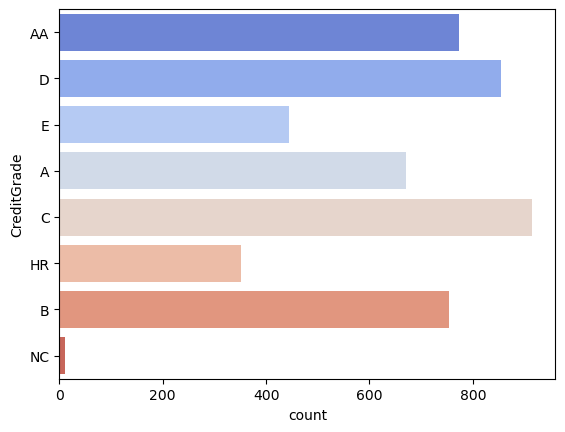

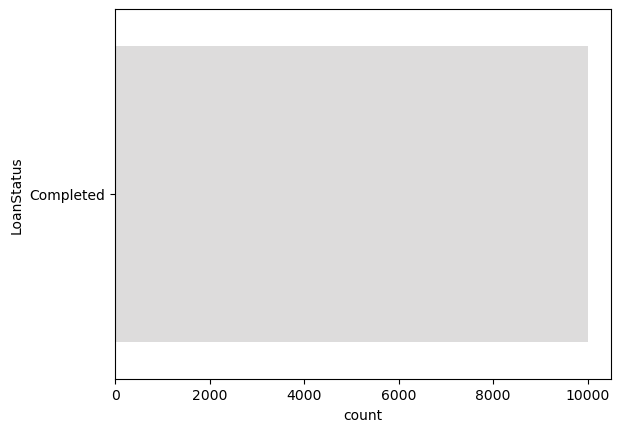

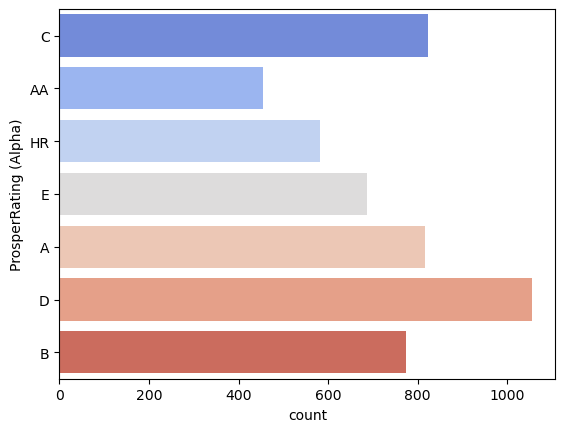

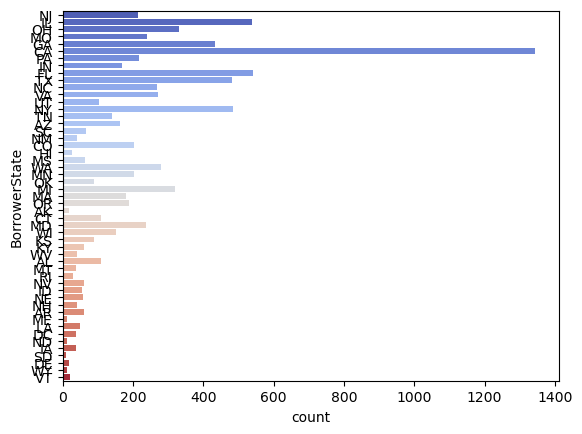

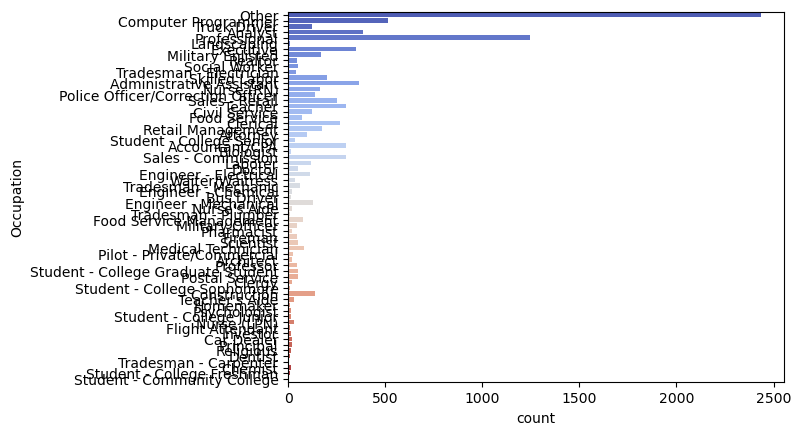

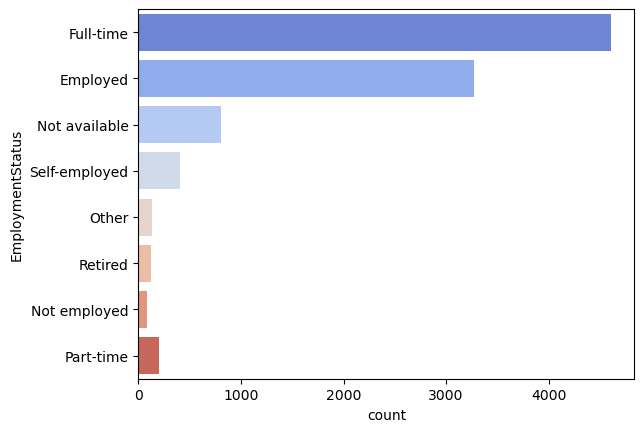

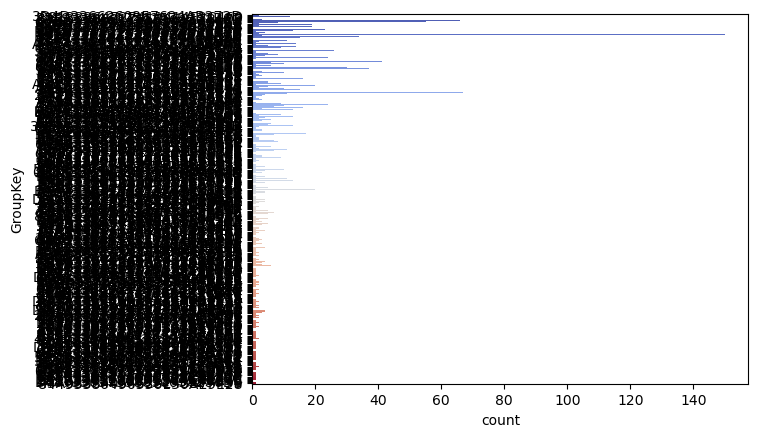

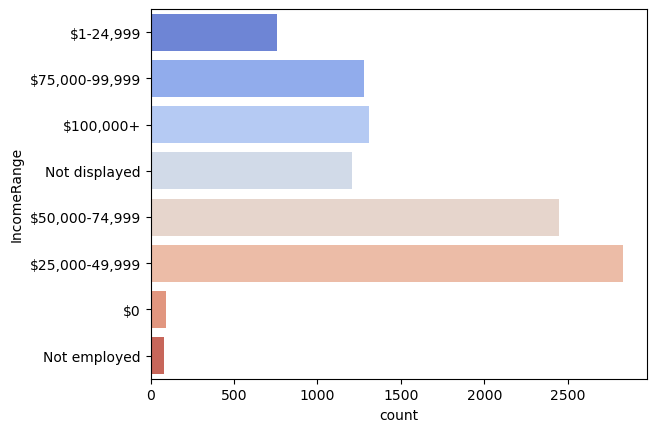

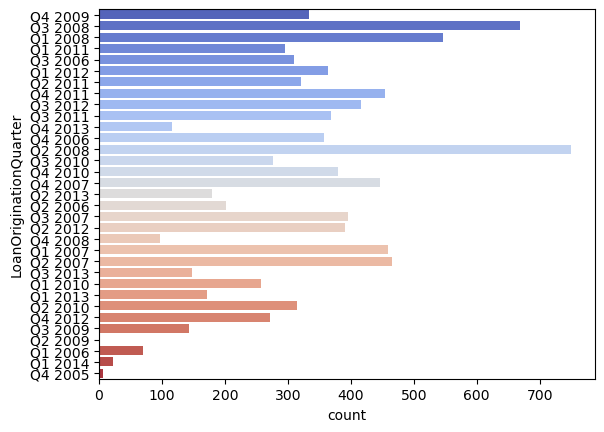

In [83]:
for column in categorical_columns:
    
    plt.figure()
    
    sns.countplot(data = df, y = column, palette ='coolwarm')

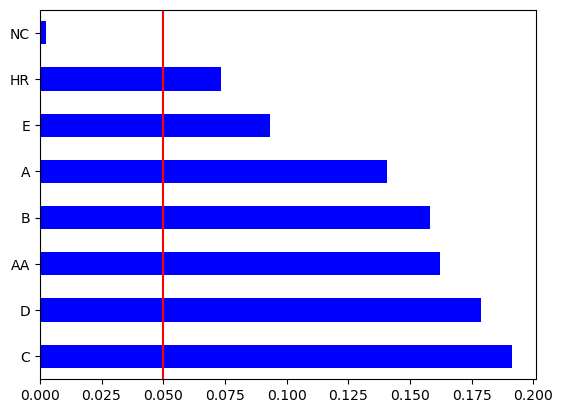

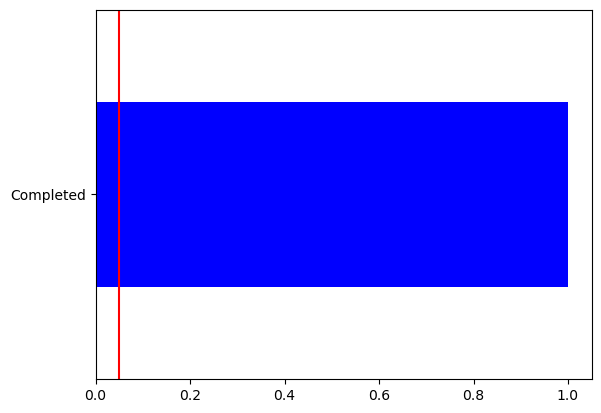

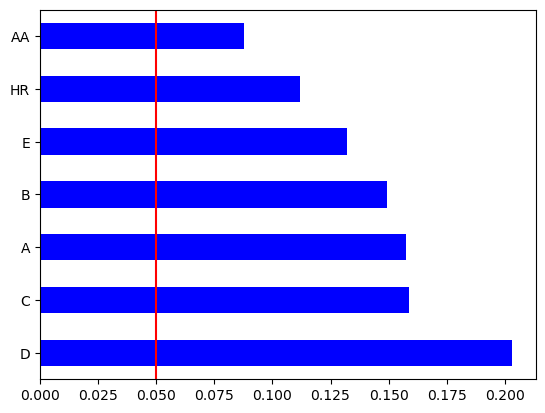

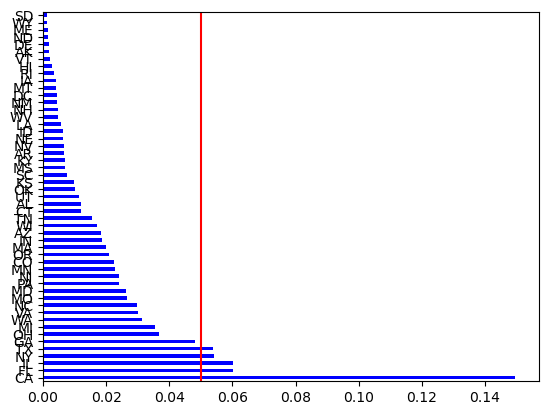

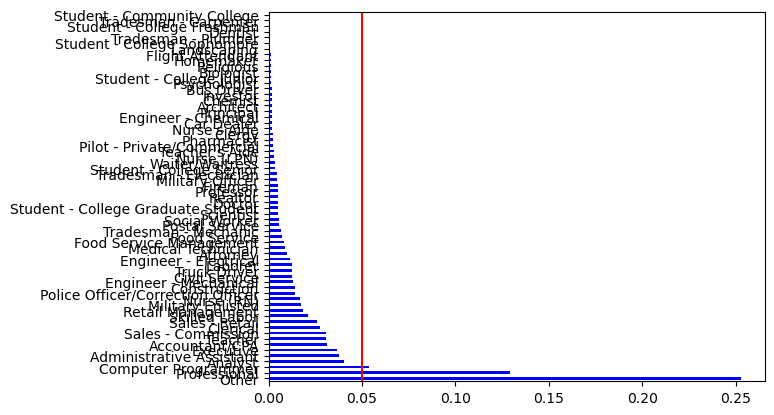

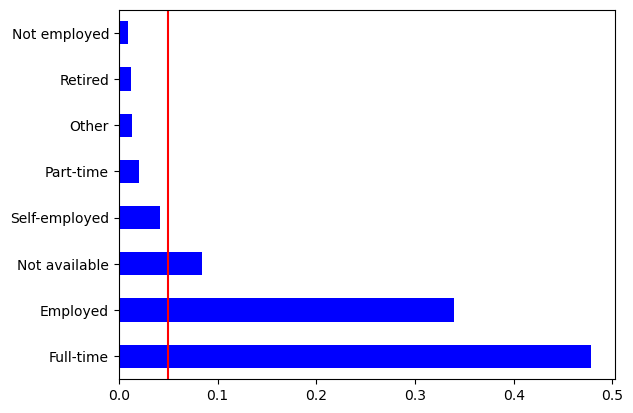

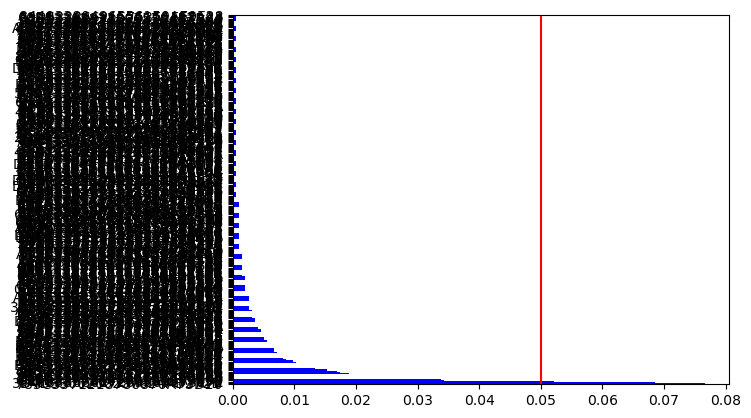

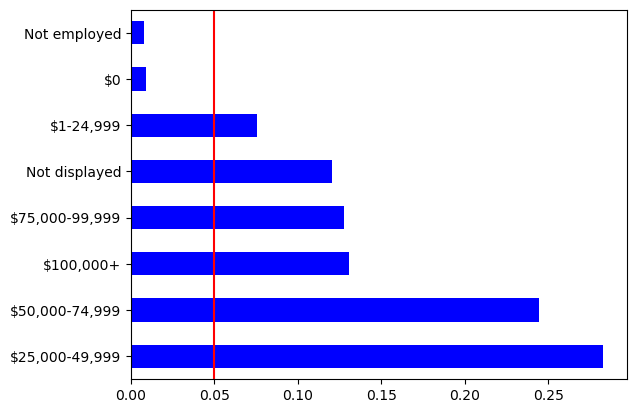

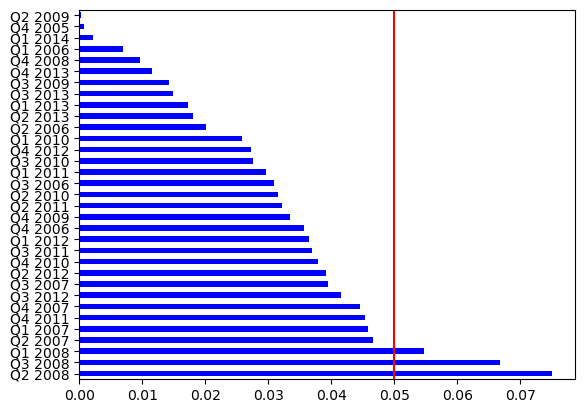

In [86]:
for column in categorical_columns:
    
    plt.figure()
    
    df[column].value_counts(normalize = True, sort = True).plot(kind = 'barh', color = 'blue')
    
    plt.axvline(x=0.05, color='red')

### Univariate analysis and distribution of numerical columns

In [87]:
numerical_columns = df.select_dtypes('number').columns

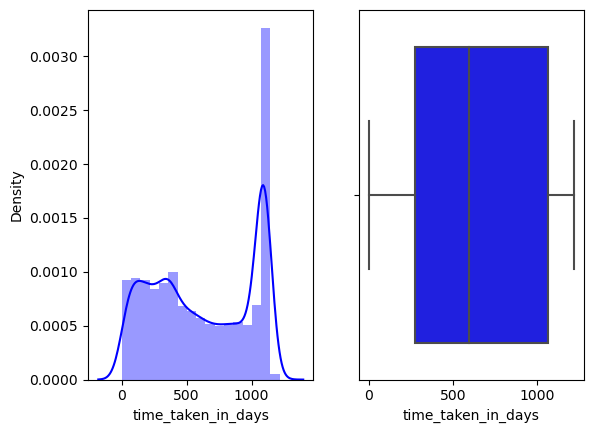

<Figure size 640x480 with 0 Axes>

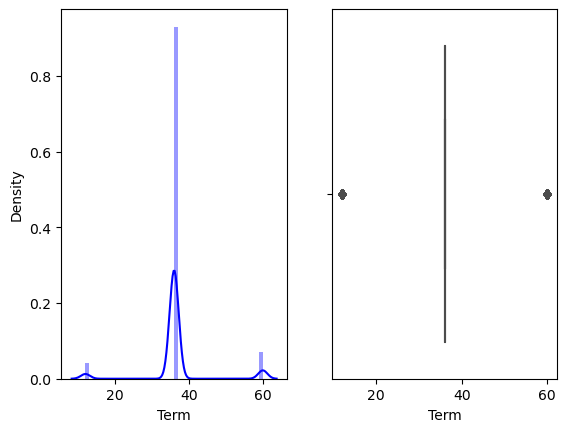

<Figure size 640x480 with 0 Axes>

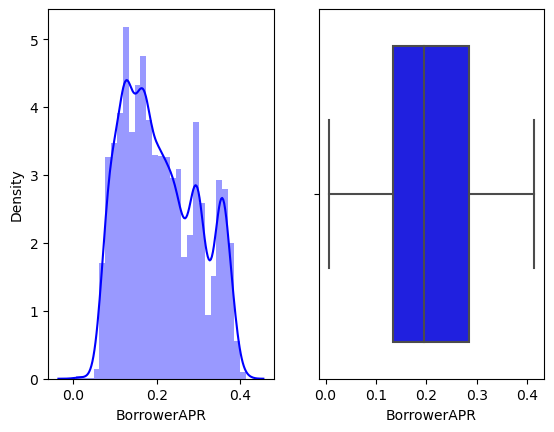

<Figure size 640x480 with 0 Axes>

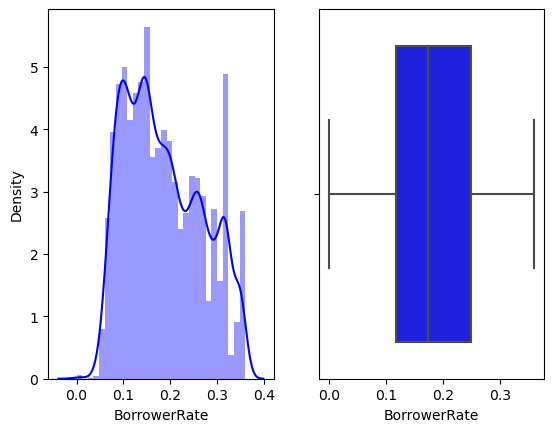

<Figure size 640x480 with 0 Axes>

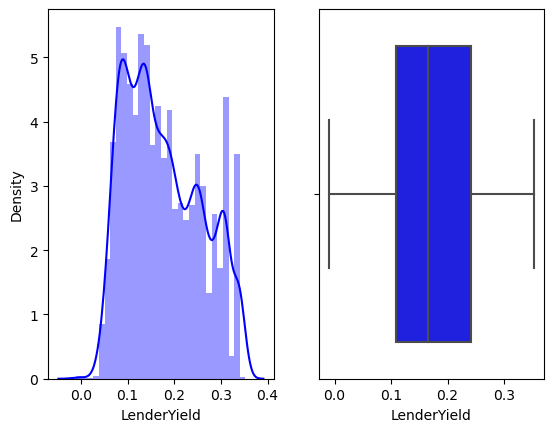

<Figure size 640x480 with 0 Axes>

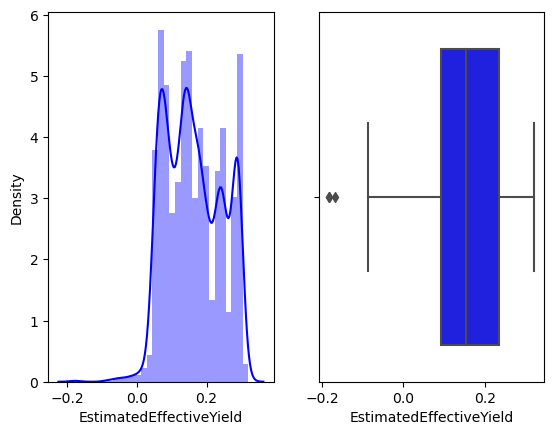

<Figure size 640x480 with 0 Axes>

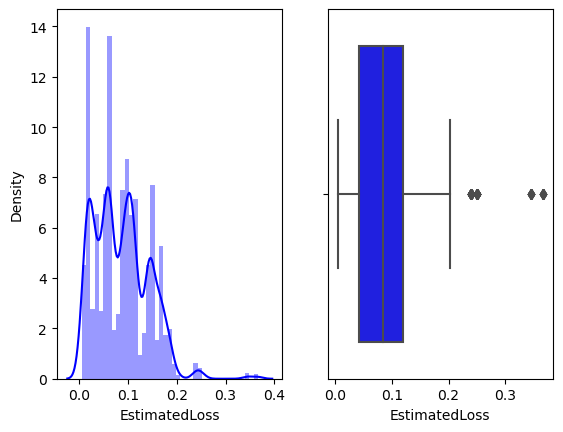

<Figure size 640x480 with 0 Axes>

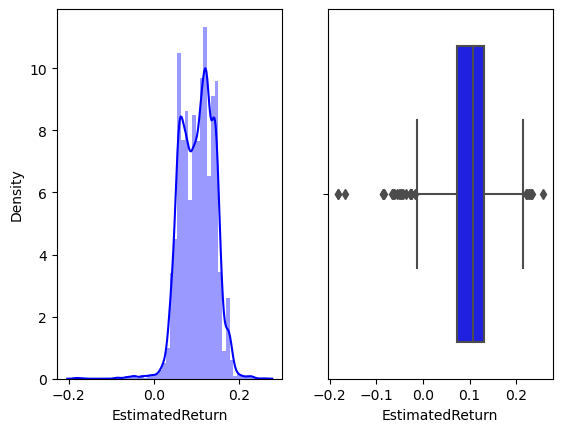

<Figure size 640x480 with 0 Axes>

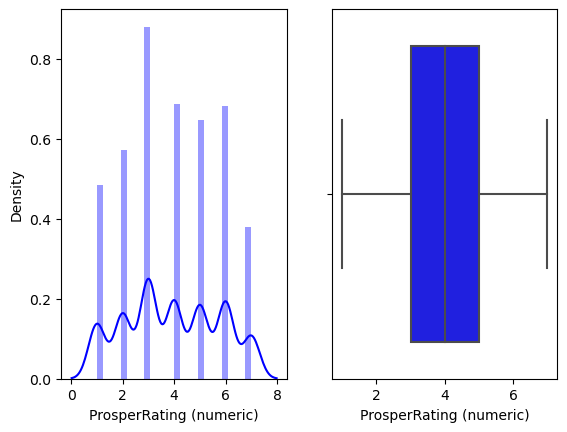

<Figure size 640x480 with 0 Axes>

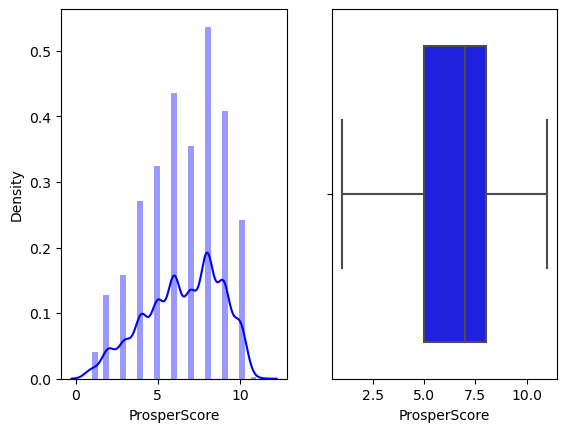

<Figure size 640x480 with 0 Axes>

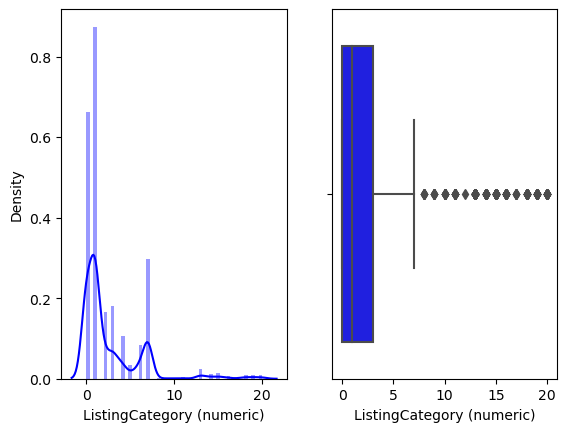

<Figure size 640x480 with 0 Axes>

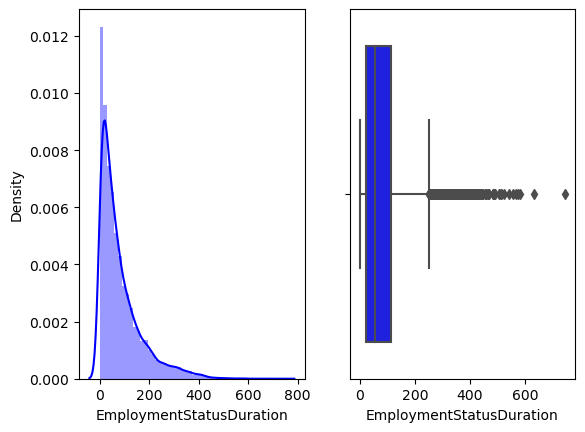

<Figure size 640x480 with 0 Axes>

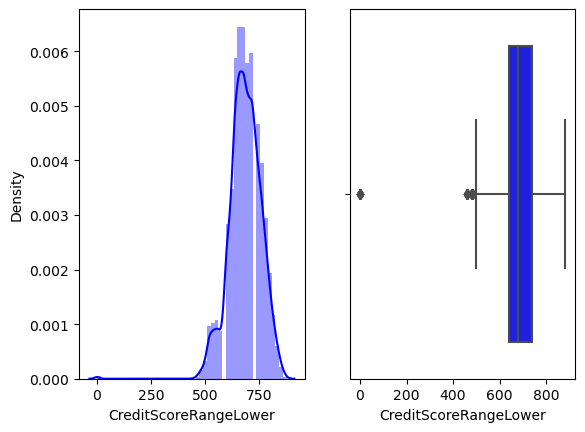

<Figure size 640x480 with 0 Axes>

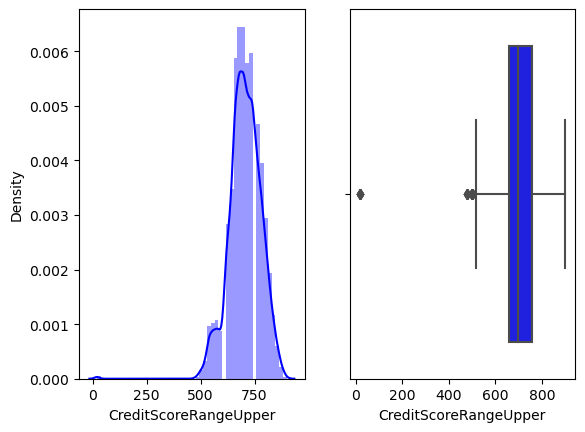

<Figure size 640x480 with 0 Axes>

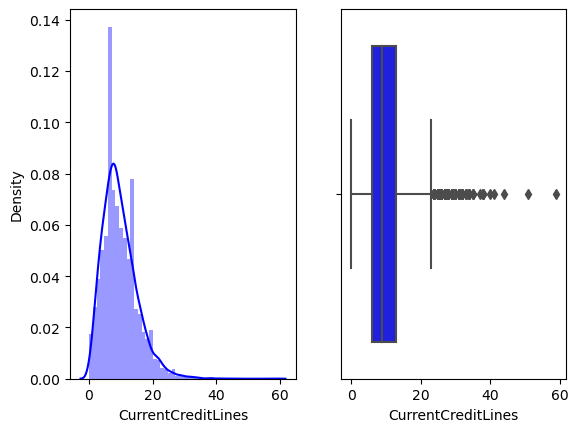

<Figure size 640x480 with 0 Axes>

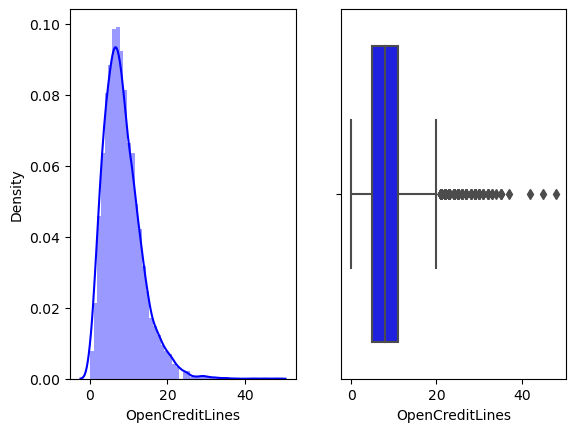

<Figure size 640x480 with 0 Axes>

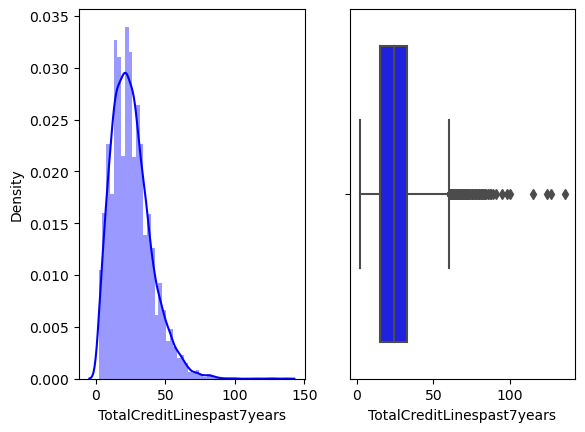

<Figure size 640x480 with 0 Axes>

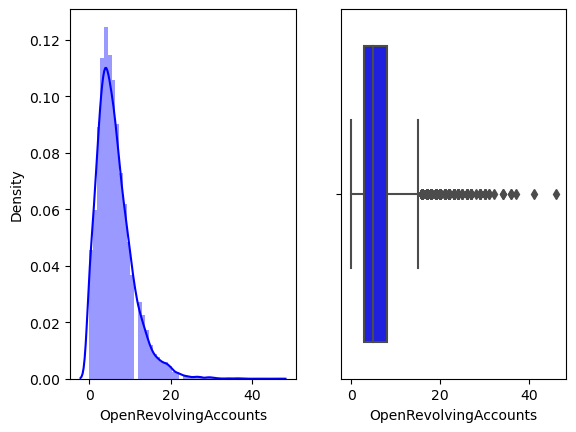

<Figure size 640x480 with 0 Axes>

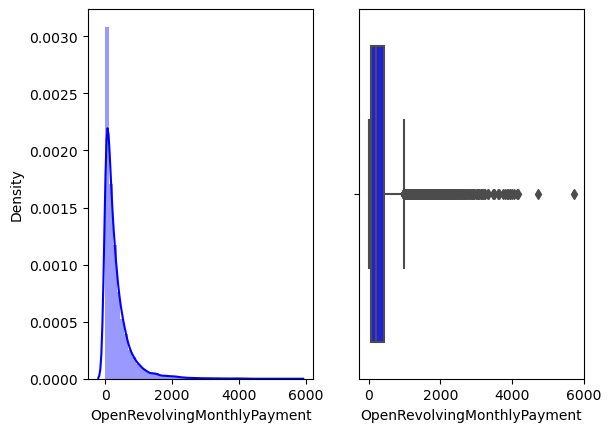

<Figure size 640x480 with 0 Axes>

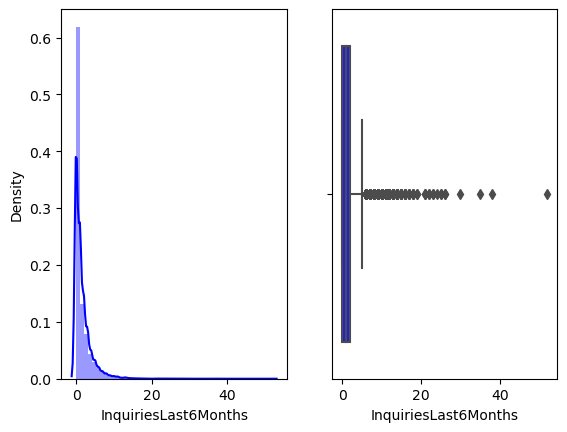

<Figure size 640x480 with 0 Axes>

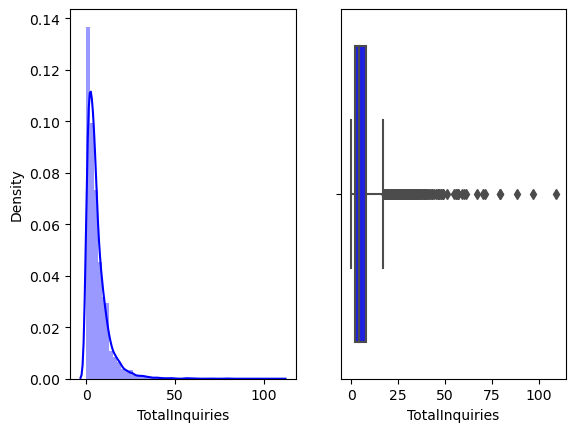

<Figure size 640x480 with 0 Axes>

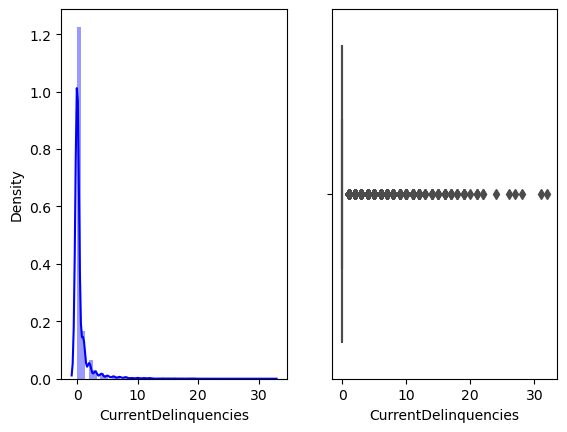

<Figure size 640x480 with 0 Axes>

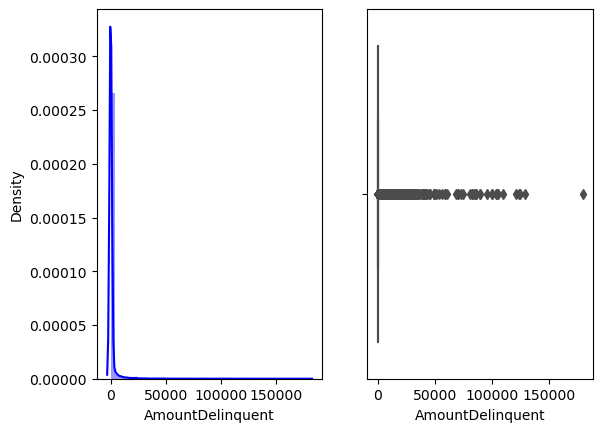

<Figure size 640x480 with 0 Axes>

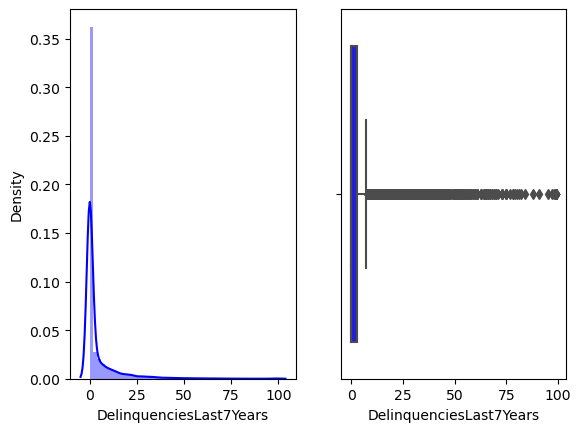

<Figure size 640x480 with 0 Axes>

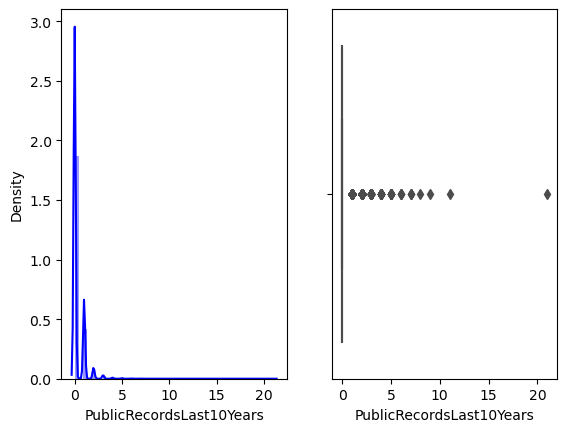

<Figure size 640x480 with 0 Axes>

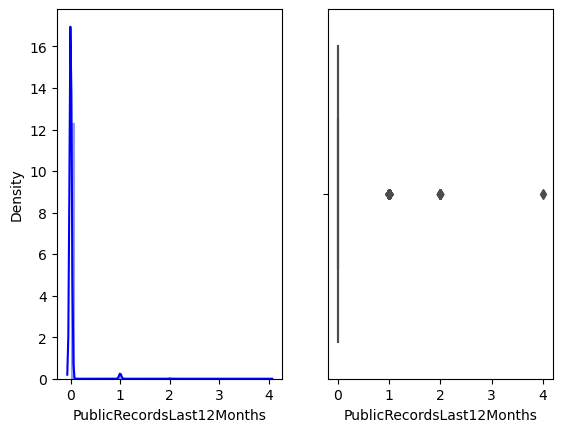

<Figure size 640x480 with 0 Axes>

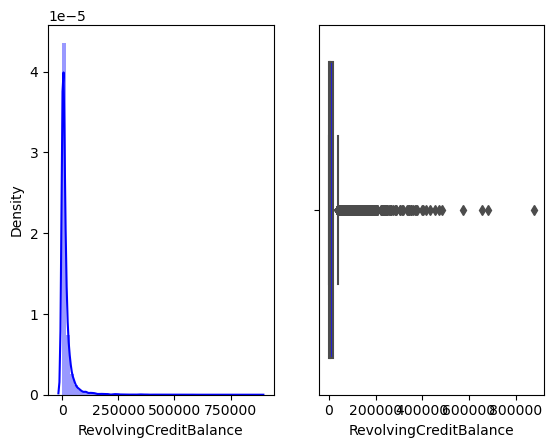

<Figure size 640x480 with 0 Axes>

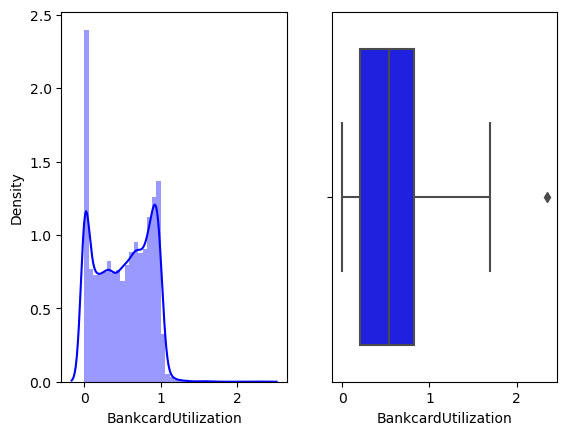

<Figure size 640x480 with 0 Axes>

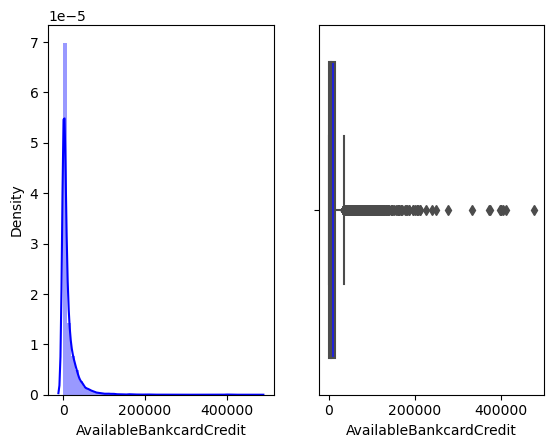

<Figure size 640x480 with 0 Axes>

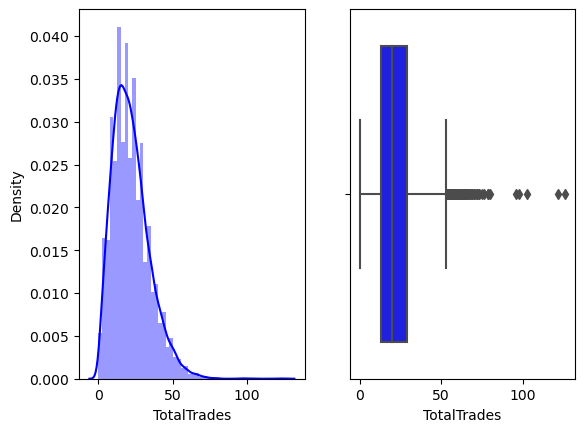

<Figure size 640x480 with 0 Axes>

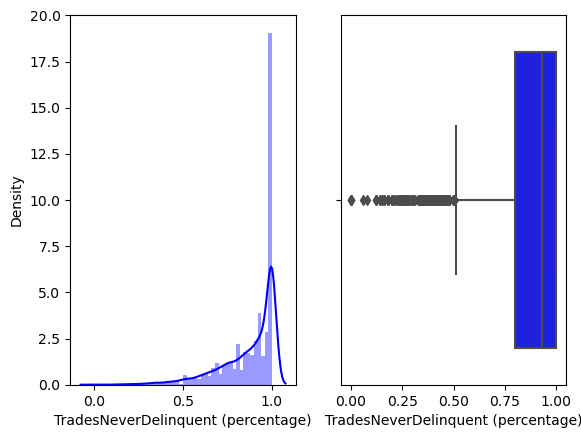

<Figure size 640x480 with 0 Axes>

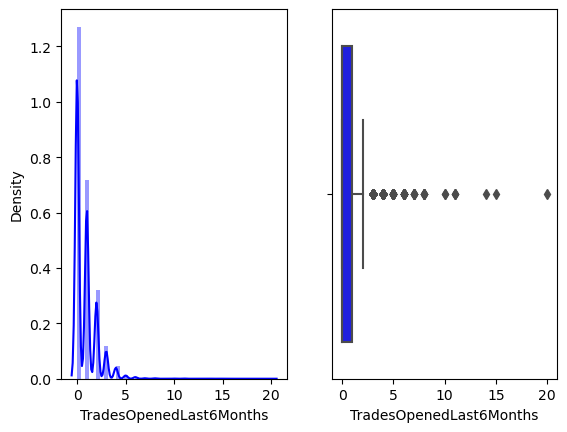

<Figure size 640x480 with 0 Axes>

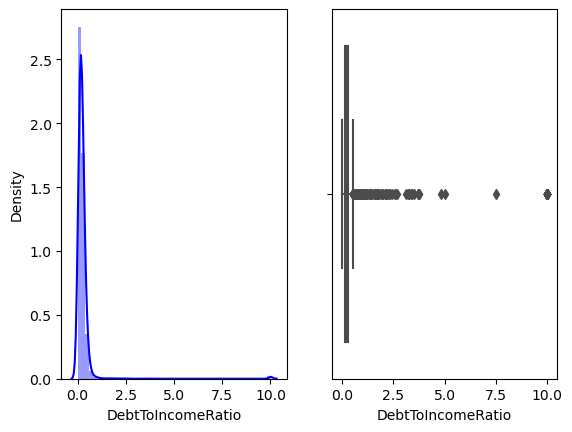

<Figure size 640x480 with 0 Axes>

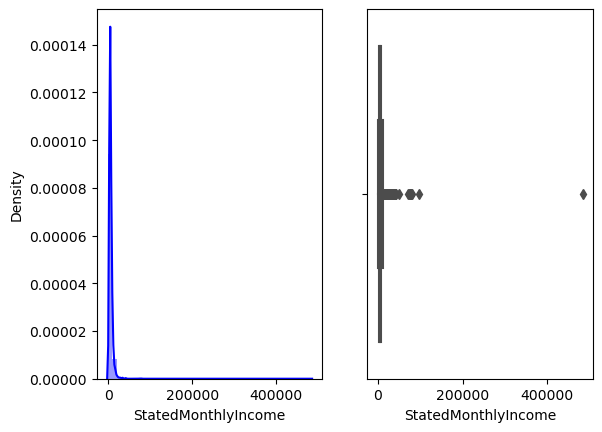

<Figure size 640x480 with 0 Axes>

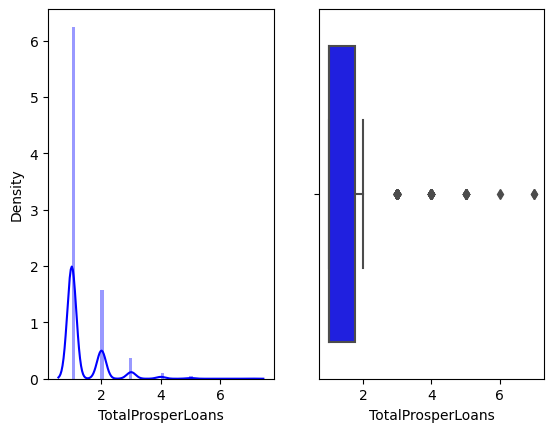

<Figure size 640x480 with 0 Axes>

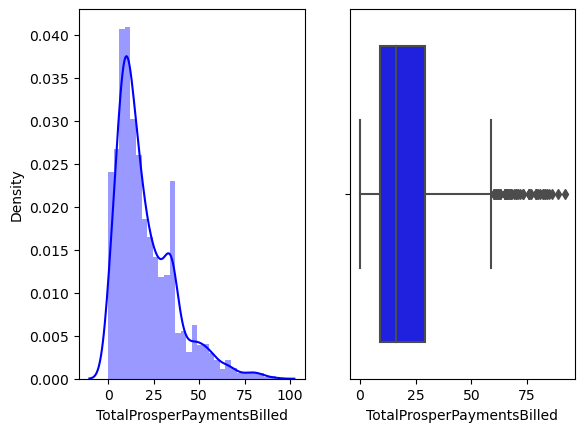

<Figure size 640x480 with 0 Axes>

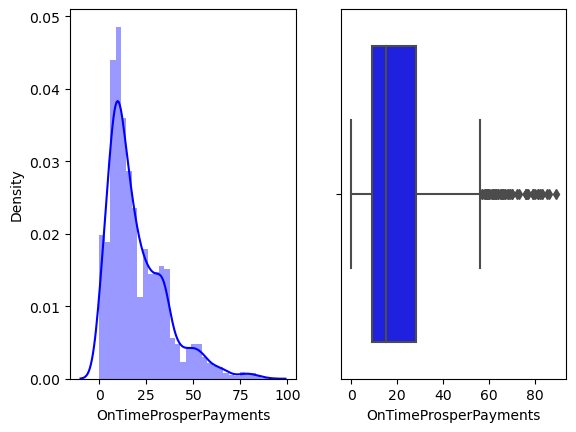

<Figure size 640x480 with 0 Axes>

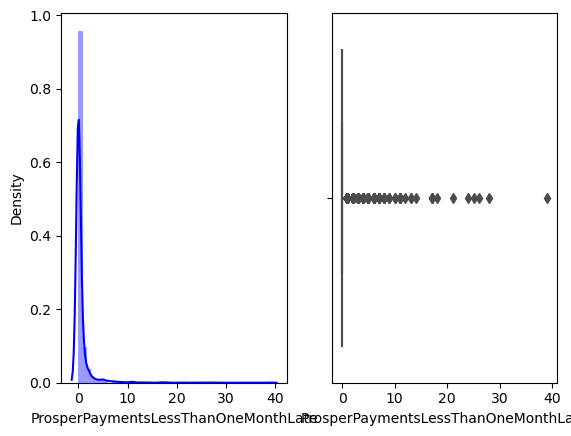

<Figure size 640x480 with 0 Axes>

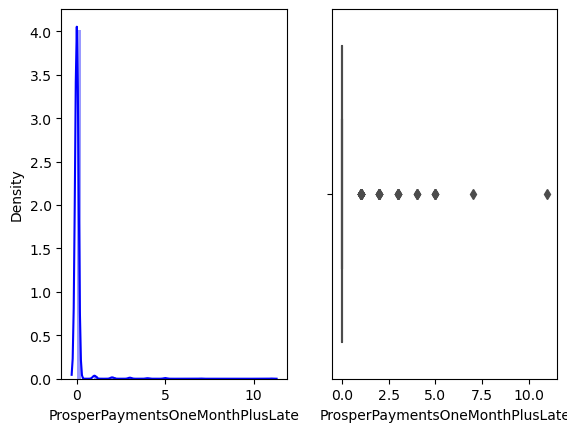

<Figure size 640x480 with 0 Axes>

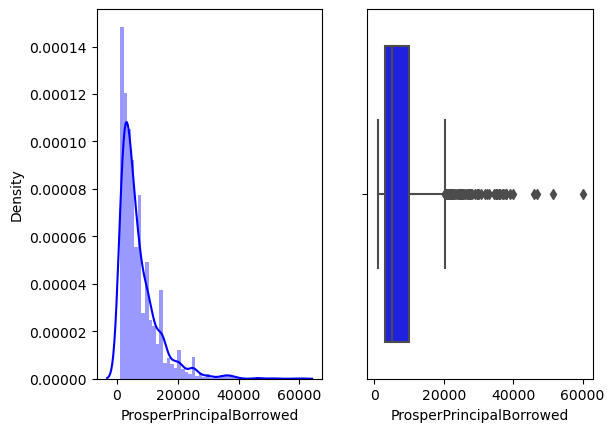

<Figure size 640x480 with 0 Axes>

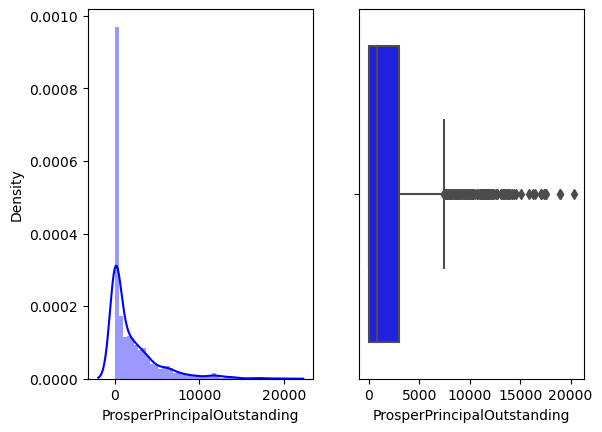

<Figure size 640x480 with 0 Axes>

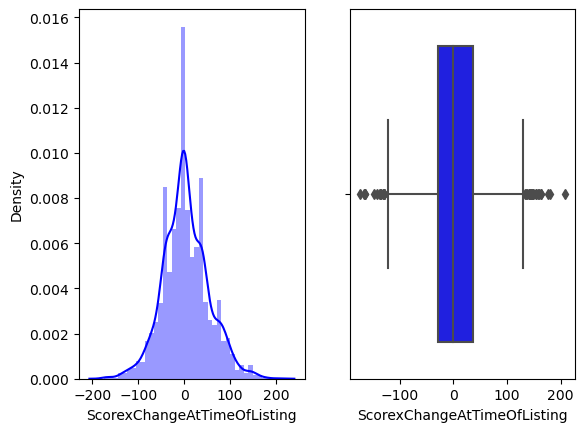

<Figure size 640x480 with 0 Axes>

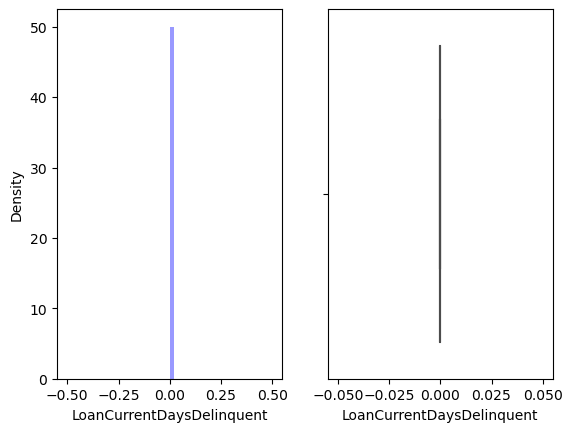

<Figure size 640x480 with 0 Axes>

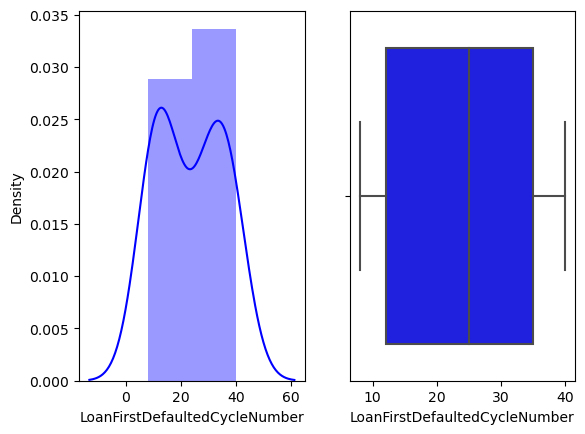

<Figure size 640x480 with 0 Axes>

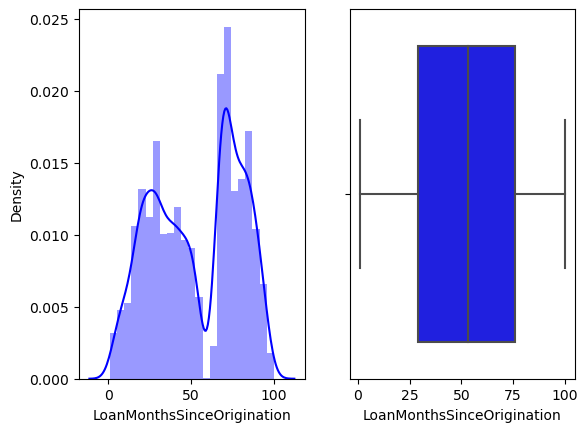

<Figure size 640x480 with 0 Axes>

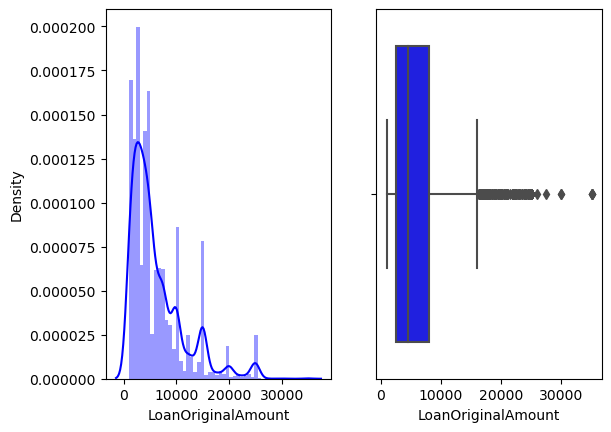

<Figure size 640x480 with 0 Axes>

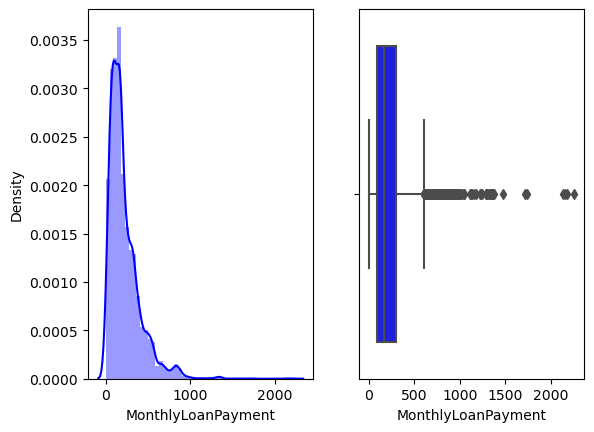

<Figure size 640x480 with 0 Axes>

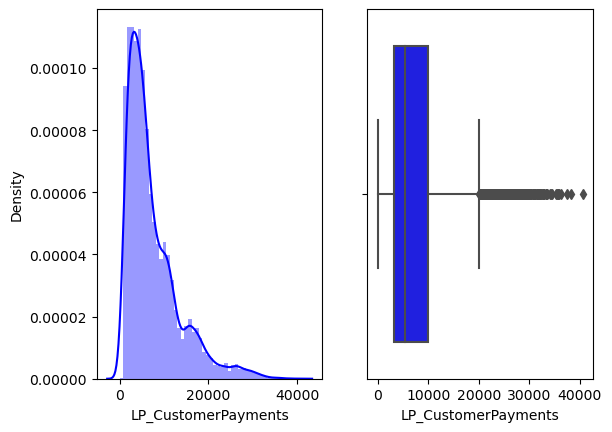

<Figure size 640x480 with 0 Axes>

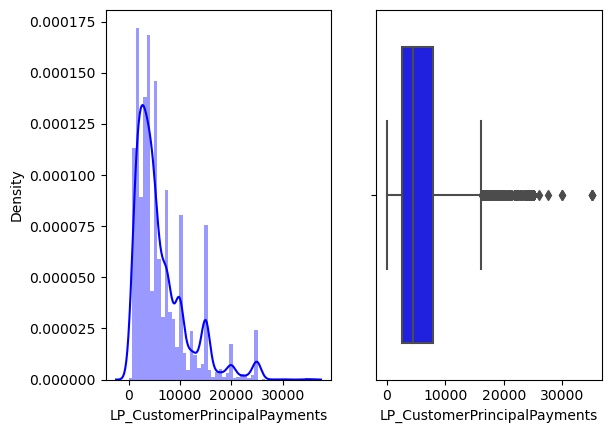

<Figure size 640x480 with 0 Axes>

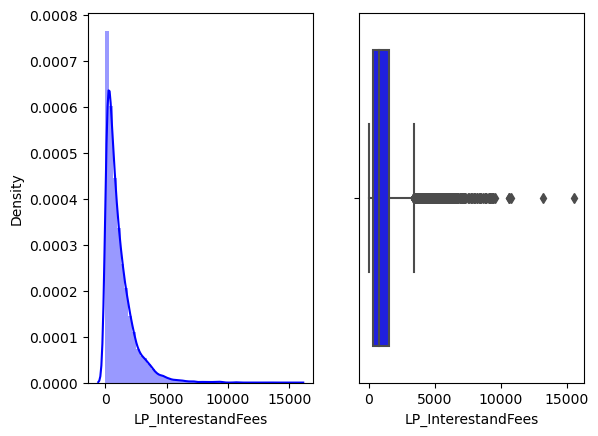

<Figure size 640x480 with 0 Axes>

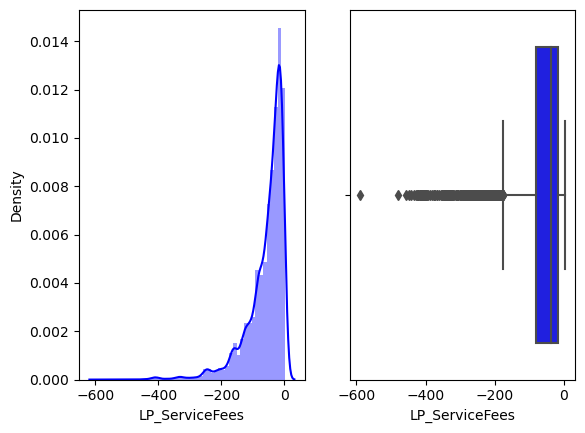

<Figure size 640x480 with 0 Axes>

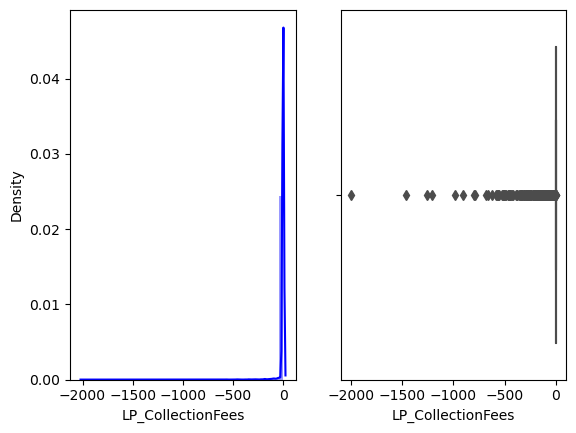

<Figure size 640x480 with 0 Axes>

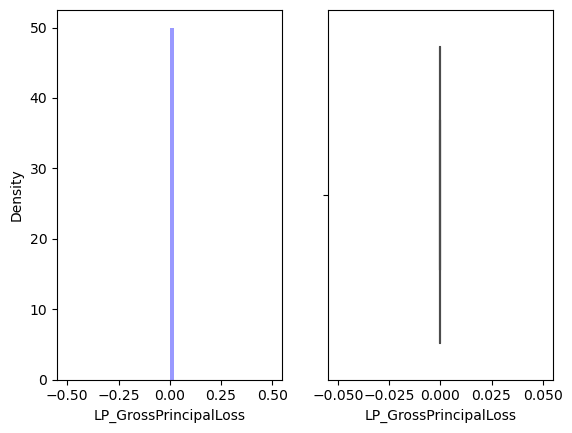

<Figure size 640x480 with 0 Axes>

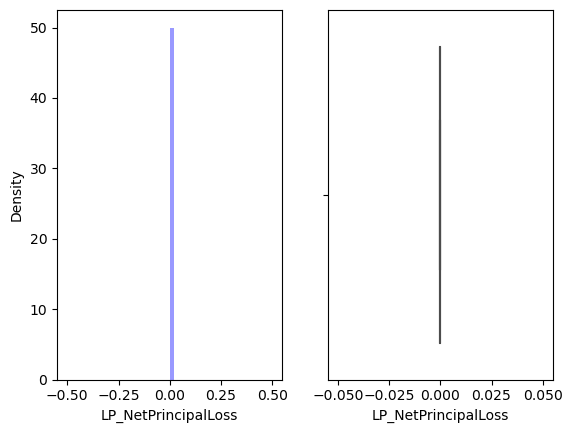

<Figure size 640x480 with 0 Axes>

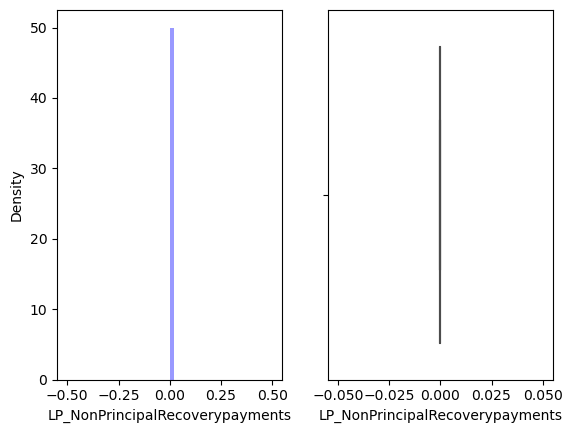

<Figure size 640x480 with 0 Axes>

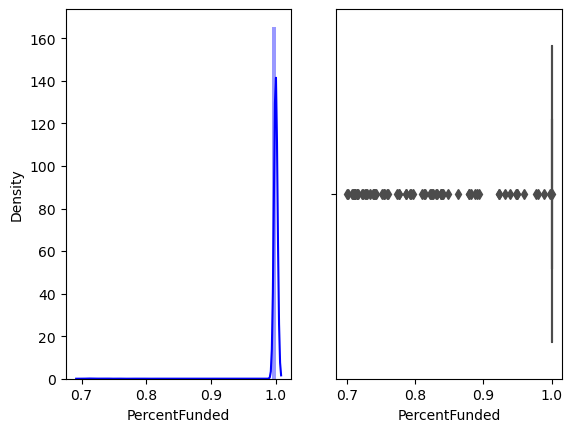

<Figure size 640x480 with 0 Axes>

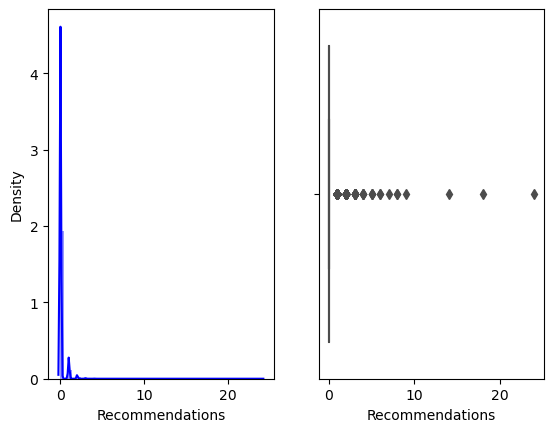

<Figure size 640x480 with 0 Axes>

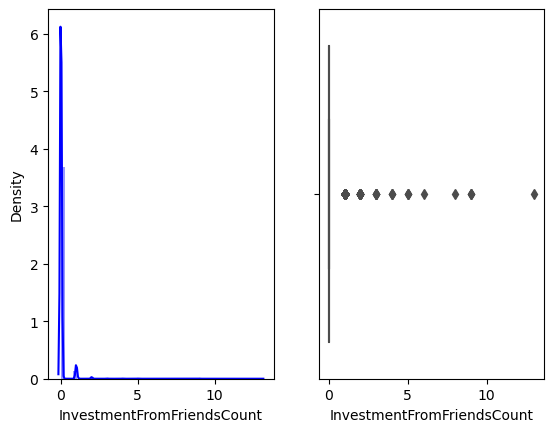

<Figure size 640x480 with 0 Axes>

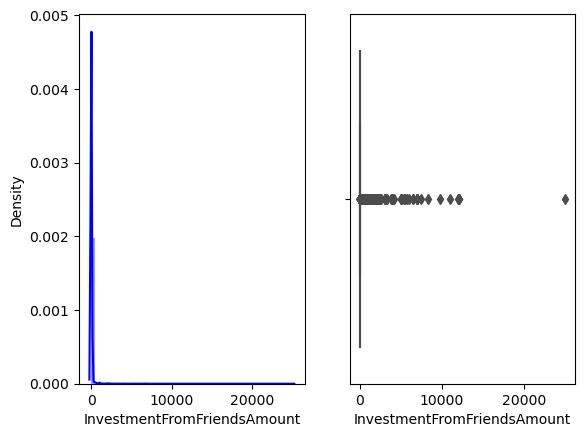

<Figure size 640x480 with 0 Axes>

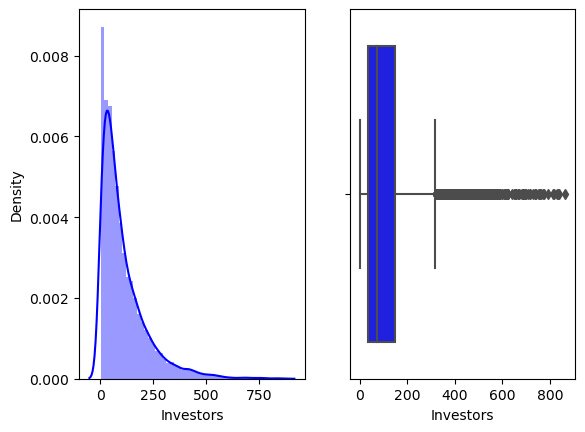

<Figure size 640x480 with 0 Axes>

In [90]:
for column in numerical_columns:
    
    fig, ax = plt.subplots(1,2)
    
    plt.figure()
    
    sns.distplot(df[column], color = 'blue', kde = True, ax = ax[0])
    
    sns.boxplot(data = df, x = column, color = 'blue', ax = ax[1])

### Bivariate analysis

- Between date and some numerical columns
- Between numerical columns and target (numeric
- Between categorical and target(numeric)

In [94]:
num_sample = np.random.choice(numerical_columns, 5)
num_sample

array(['ListingCategory (numeric)', 'InvestmentFromFriendsAmount',
       'ProsperPrincipalBorrowed', 'CreditScoreRangeUpper',
       'LP_CustomerPayments'], dtype=object)

In [97]:
# for column_date in date_columns[:2]:
    
#     for column_num in num_sample:
        
#         plt.figure()
        
#         sns.lineplot(data = df, x = column_date, y = column_num, color = 'blue')

In [98]:
target = 'time_taken_in_days'

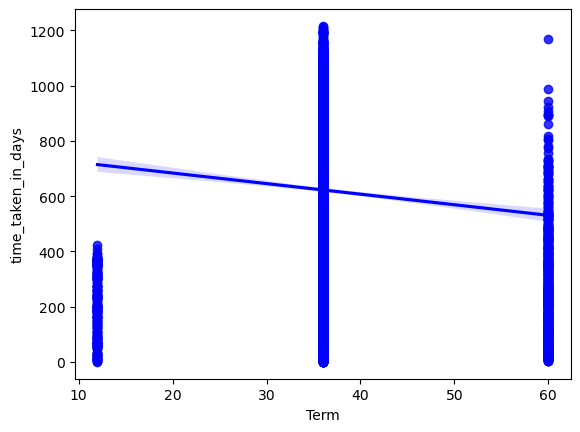

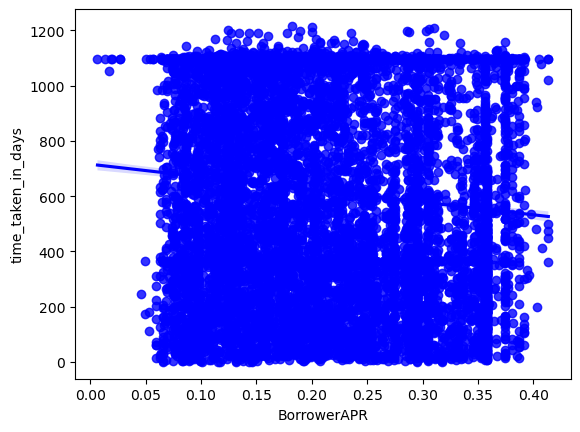

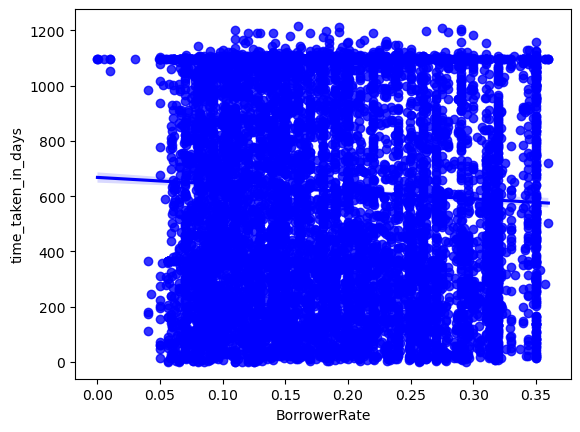

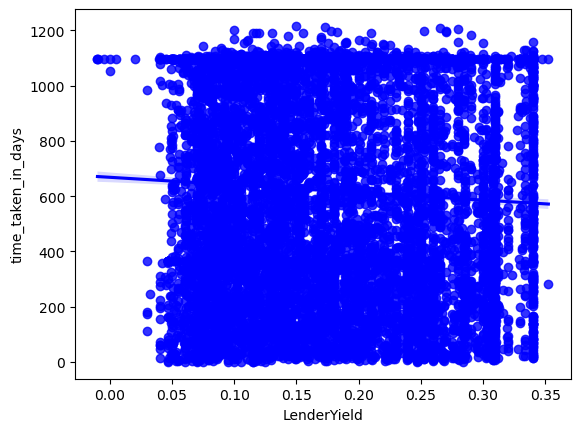

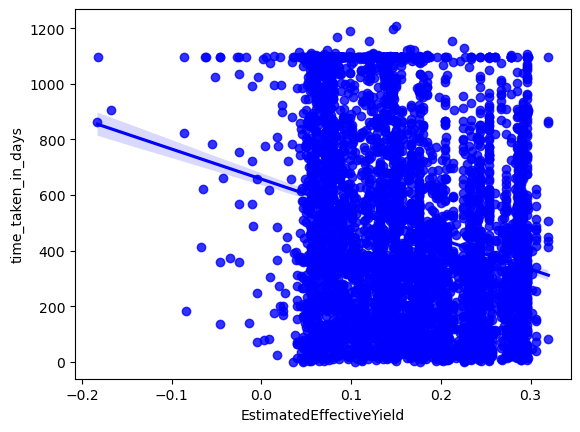

...

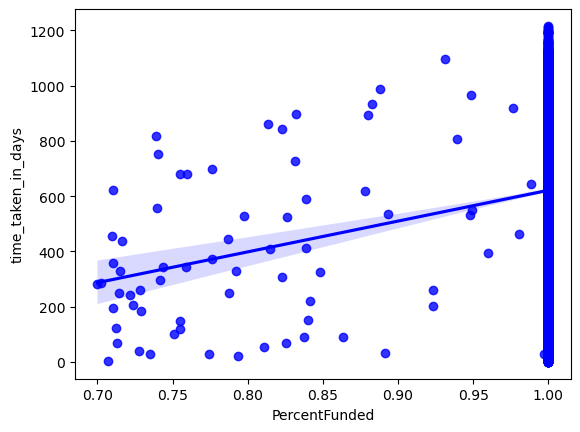

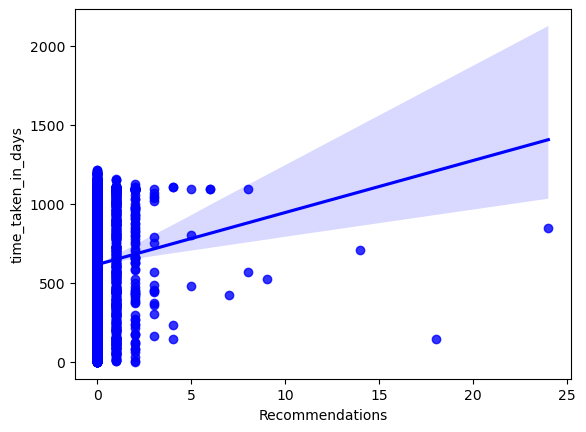

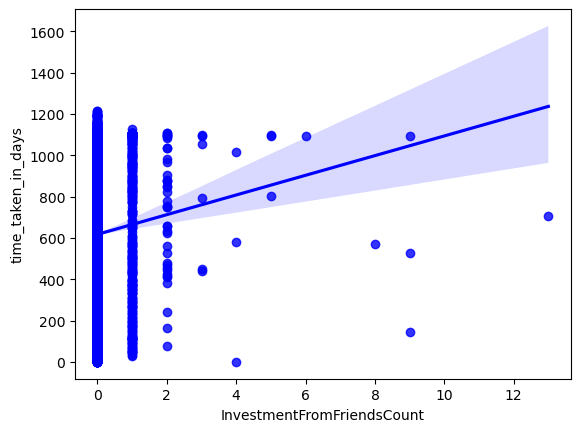

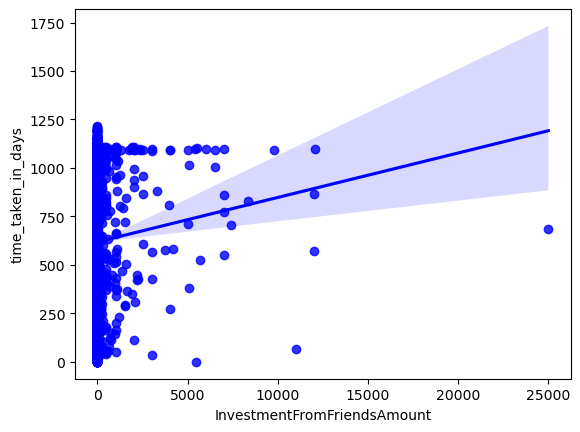

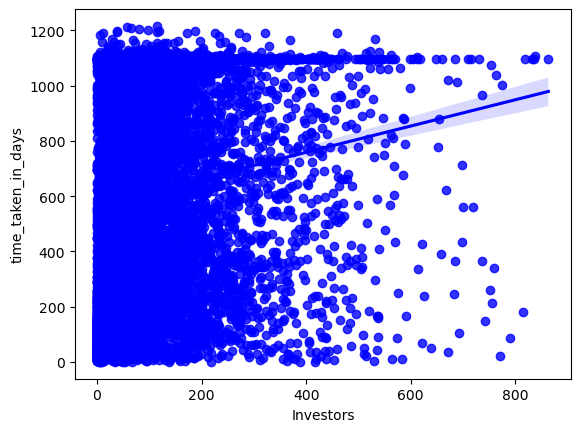

In [103]:
for column in numerical_columns:
    
    if column != target:
        
        plt.figure()
        
        sns.regplot(data = df, x = column, y = target, color = 'blue')

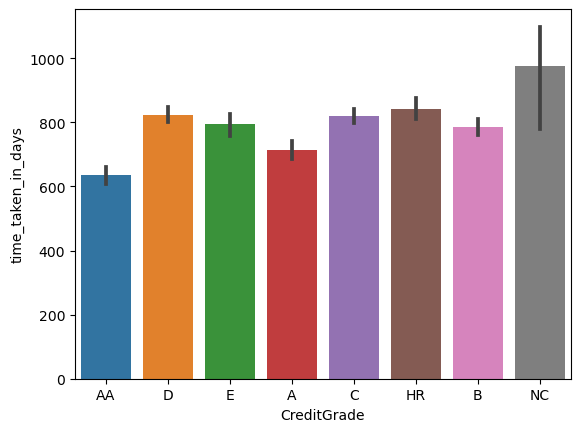

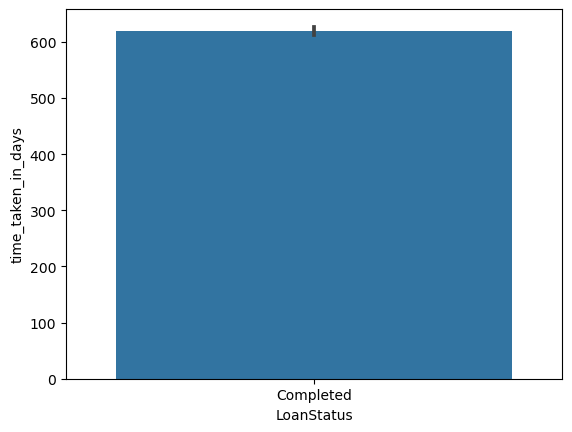

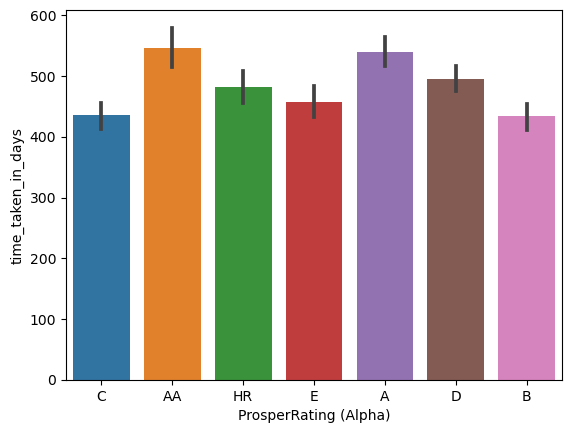

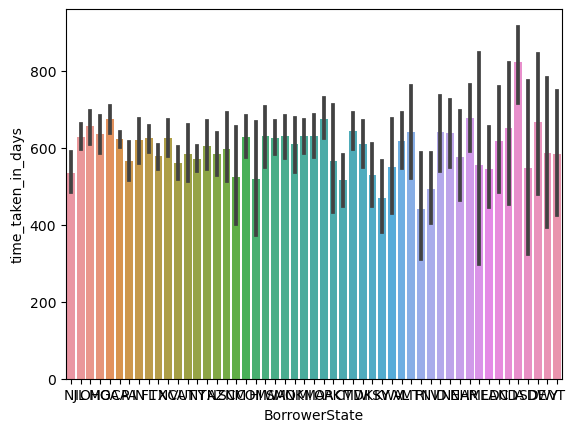

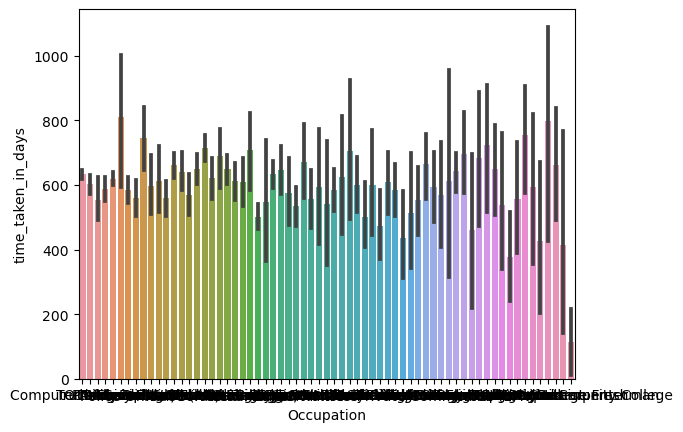

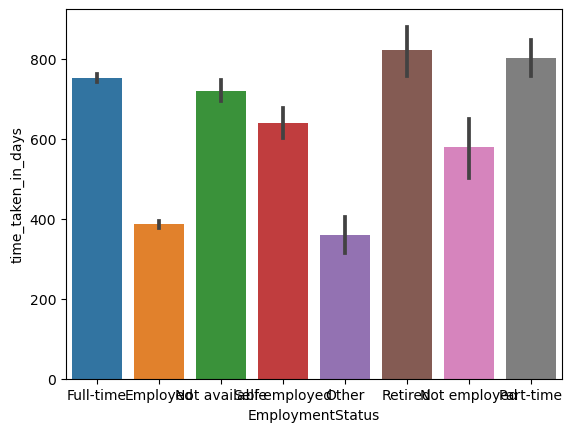

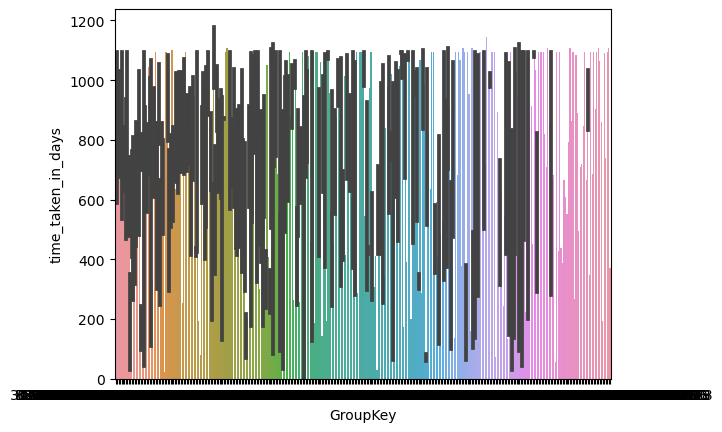

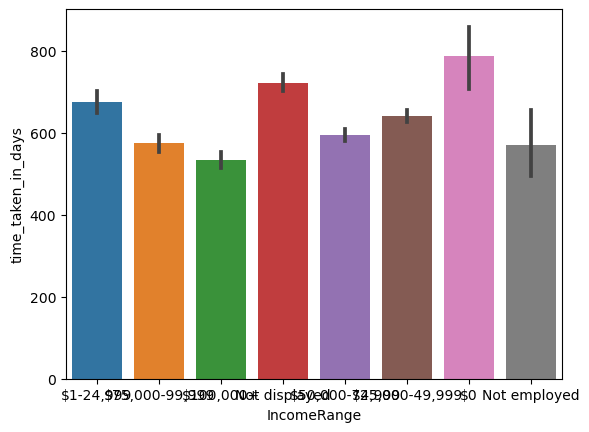

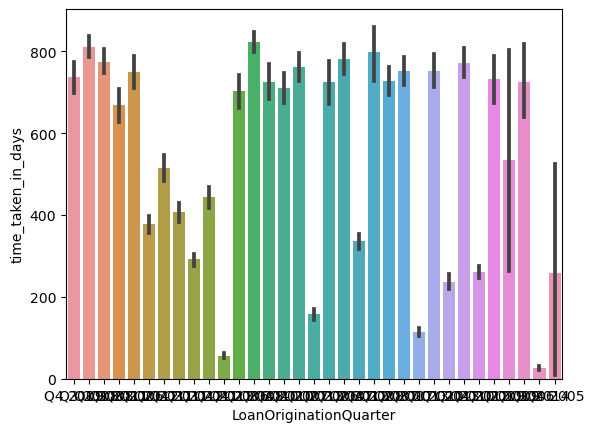

In [101]:
for column in categorical_columns:
    
    plt.figure()
    
    sns.barplot(data = df, x = column, y = target)

<Figure size 640x480 with 0 Axes>

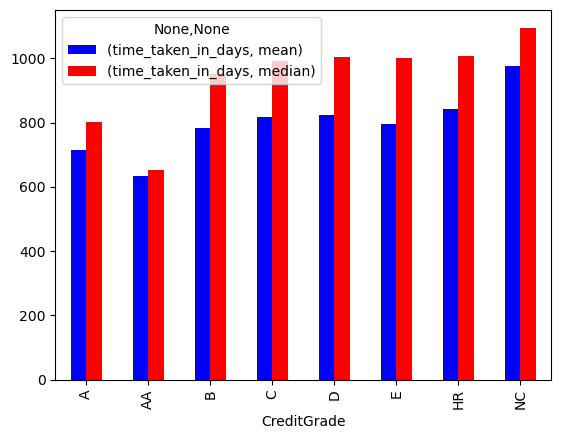

<Figure size 640x480 with 0 Axes>

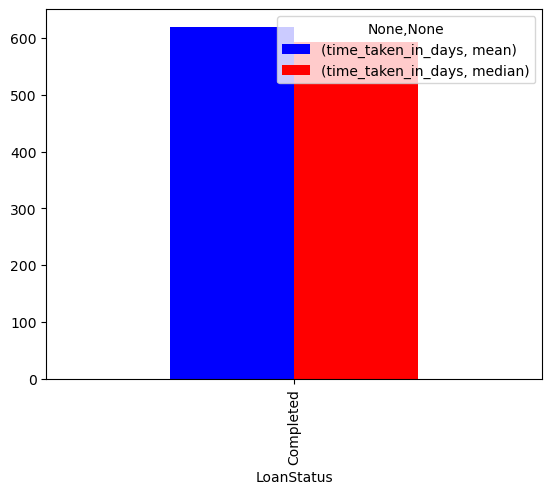

<Figure size 640x480 with 0 Axes>

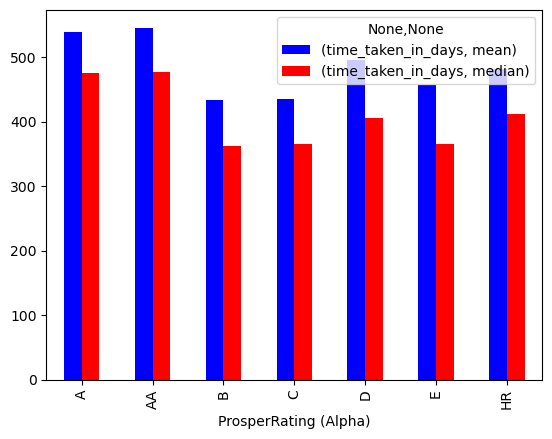

<Figure size 640x480 with 0 Axes>

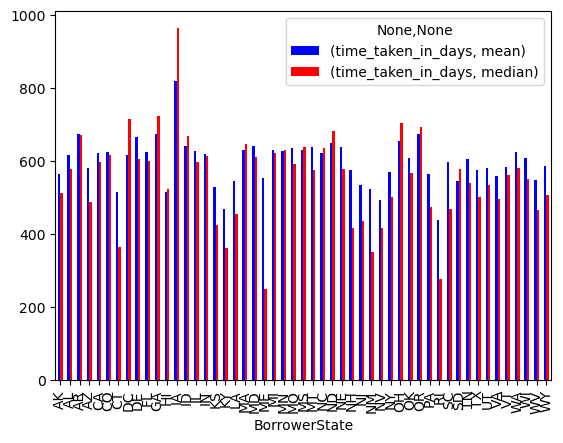

<Figure size 640x480 with 0 Axes>

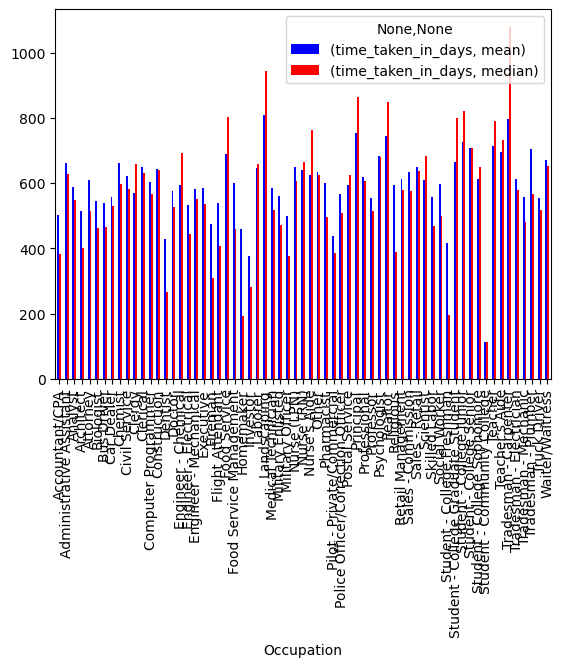

<Figure size 640x480 with 0 Axes>

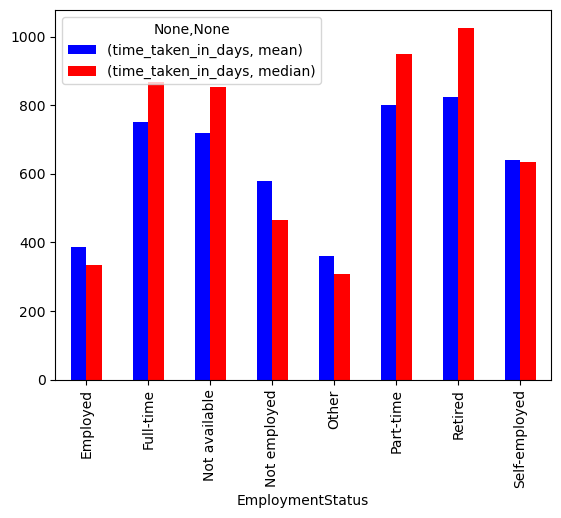

<Figure size 640x480 with 0 Axes>

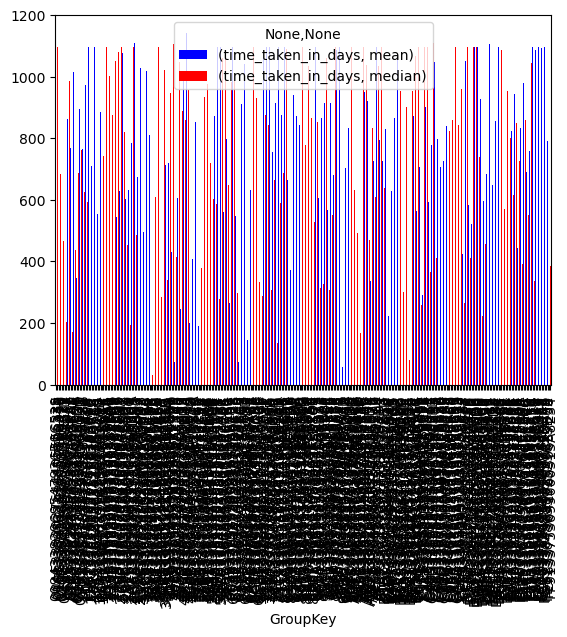

<Figure size 640x480 with 0 Axes>

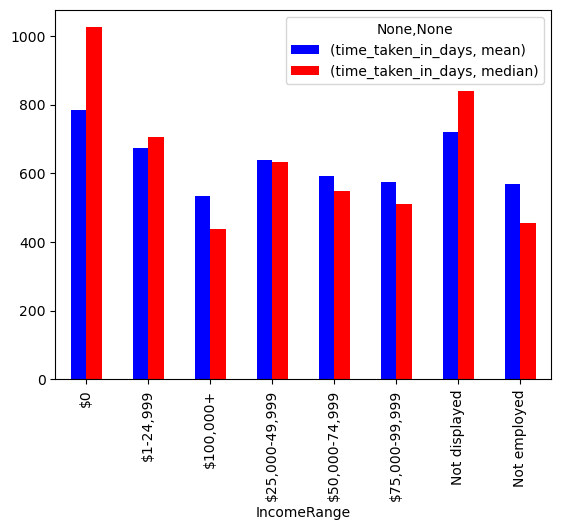

<Figure size 640x480 with 0 Axes>

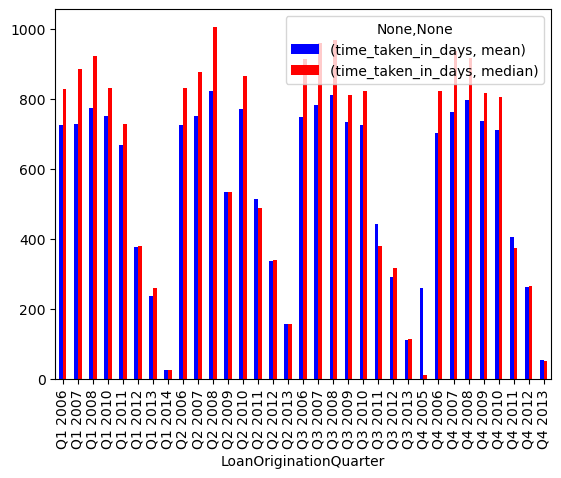

In [104]:
for column in categorical_columns:
    
    plt.figure()
    
    df.groupby(column).agg({target: ['mean', 'median']}).plot(kind = 'bar', color = ['blue', 'red'])

In [105]:
for column in categorical_columns:
    
    print(column)
    
    print(df.pivot_table(index = column, values = target, aggfunc = {target: ['mean', 'median']}))
    
    print('---------------------------------------------------------------------------------------------')
    
    print()

CreditGrade
                   mean  median
CreditGrade                    
A            714.512668   802.0
AA           634.540052   652.0
B            784.676393   950.5
C            818.403720   993.0
D            823.724824  1003.0
E            794.516854  1001.0
HR           843.037037  1009.0
NC           976.909091  1096.0
---------------------------------------------------------------------------------------------

LoanStatus
                mean  median
LoanStatus                  
Completed   619.6693   593.0
---------------------------------------------------------------------------------------------

ProsperRating (Alpha)
                             mean  median
ProsperRating (Alpha)                    
A                      539.597307   475.0
AA                     546.210989   477.0
B                      433.438710   362.0
C                      435.240291   365.0
D                      495.817062   406.0
E                      457.549563   366.0
HR                    

### Linearity

In [106]:
num_sample = list((num_sample)) + [target]

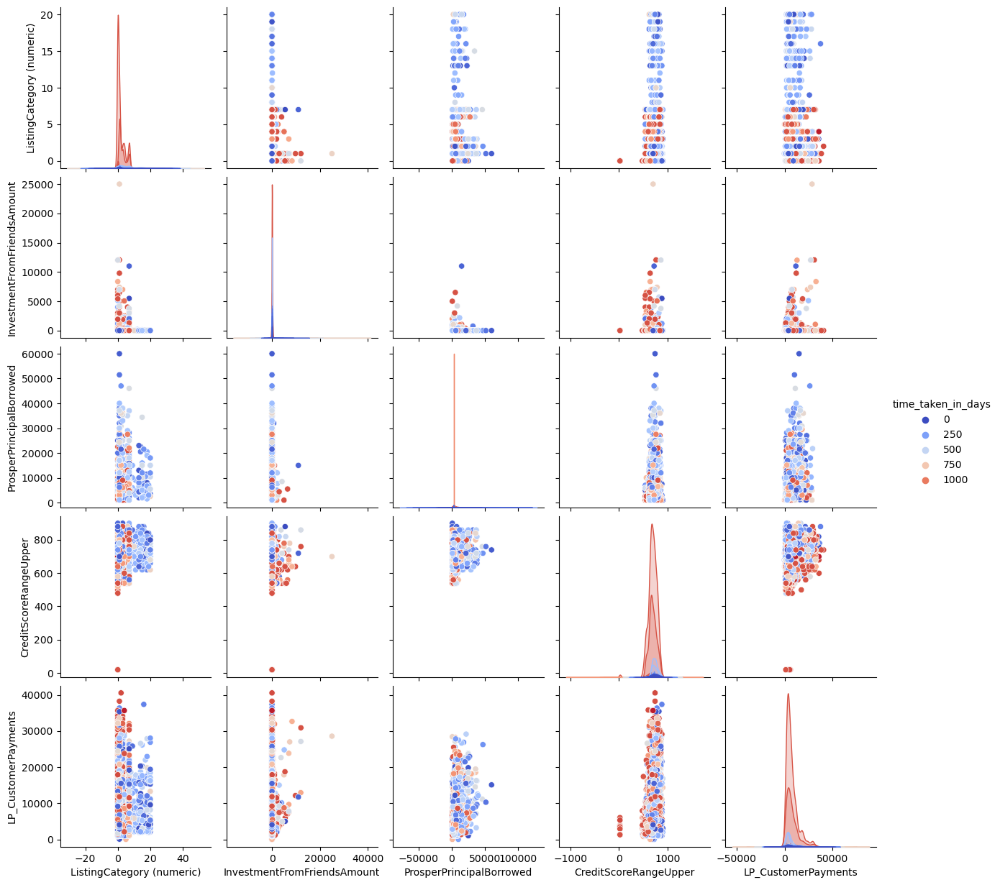

In [108]:
sns.pairplot(data = df[num_sample], hue = target, palette = 'coolwarm')

### Stats

In [111]:
columns = []
diff = []
skew = []
type_skew = []



for column in numerical_columns:
    
    columns.append(column)
    
    diff.append(df[column].max() - df[column].min())
    
    skew.append(df[column].skew())
    
    if df[column].mean() > df[column].median():
        type_skew.append('Right skew')
        
    else:
        type_skew.append('Left skew')

In [112]:
pd.DataFrame({
    
    'Features':columns,
    'Range':diff,
    'Skew':skew,
    'Type_skew':type_skew
})

,Features,Range,Skew,Type_skew
0,time_taken_in_days,1216.000000,-0.024000,Right skew
1,Term,48.000000,0.579582,Right skew
2,BorrowerAPR,0.407020,0.336675,Right skew
3,BorrowerRate,0.360000,0.365570,Right skew
4,LenderYield,0.362500,0.384100,Right skew
5,EstimatedEffectiveYield,0.502600,0.094704,Right skew
6,EstimatedLoss,0.361100,0.760114,Right skew
7,EstimatedReturn,0.439700,-0.414770,Left skew
8,ProsperRating (numeric),6.000000,0.041505,Left skew
9,ProsperScore,10.000000,-0.397782,Left skew


### Correlation

<Axes: >

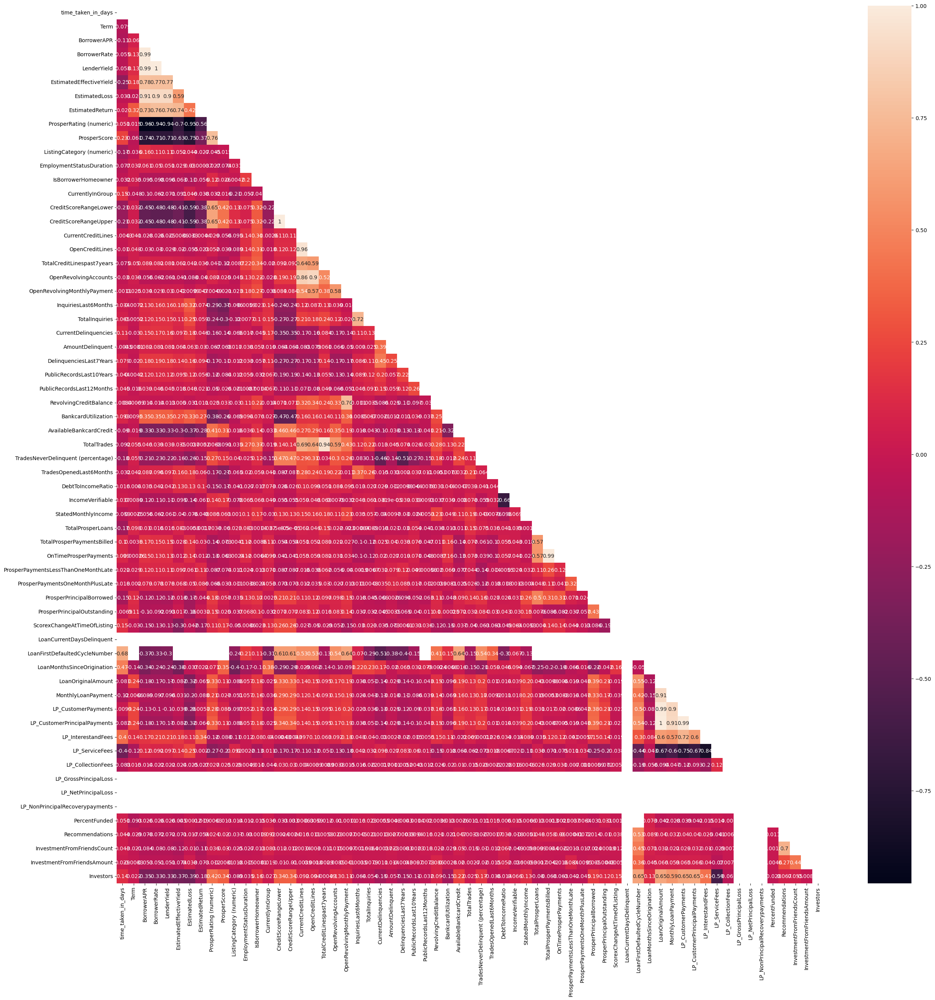

In [113]:
mask = np.triu(df.corr(method = 'pearson'))


plt.figure(figsize = (30, 30))

sns.heatmap(df.corr(method = 'pearson'), annot = True, mask = mask)

<Axes: >

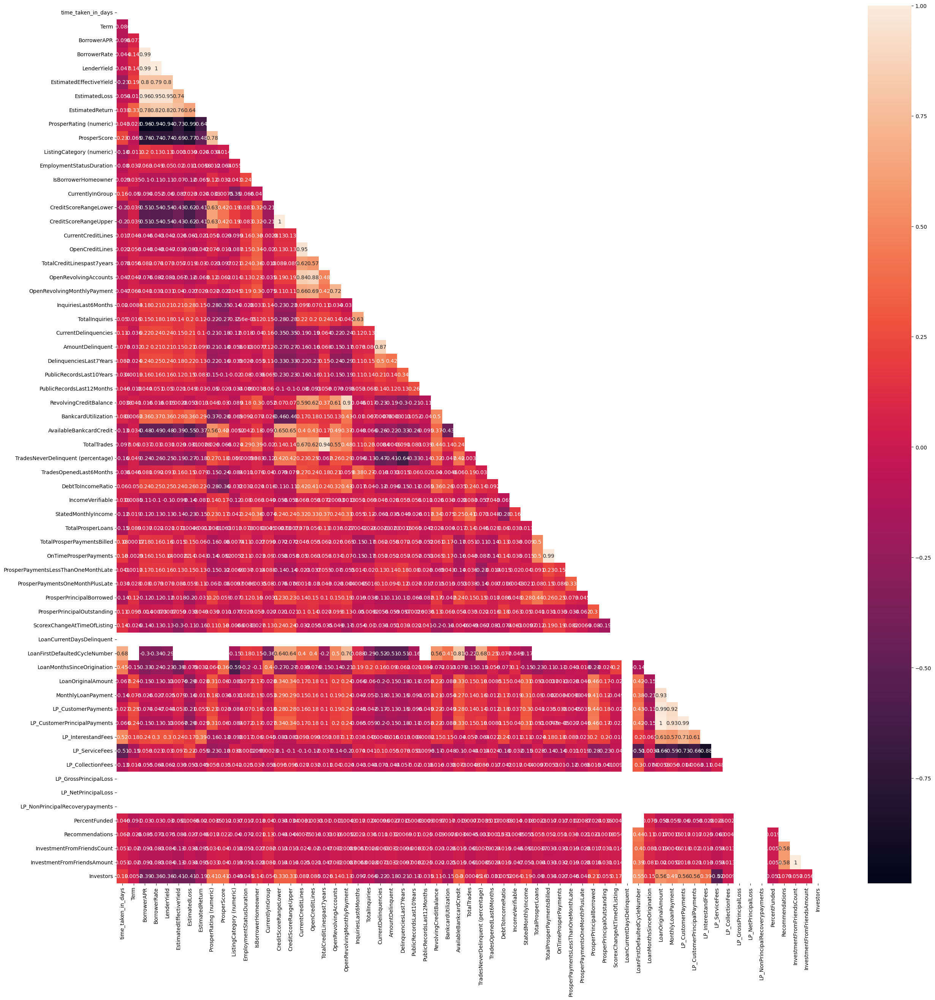

In [114]:
mask = np.triu(df.corr(method = 'spearman'))


plt.figure(figsize = (30, 30))

sns.heatmap(df.corr(method = 'spearman'), annot = True, mask = mask)

### Multicollinearity

In [115]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [116]:
vif = pd.DataFrame()

In [119]:
data = df[numerical_columns].fillna(0)

vif['vif'] = [variance_inflation_factor(data.values, index) for index in range(len(data.columns))]

vif['Features'] = data.columns

vif

,vif,Features
0,8.608939e+00,time_taken_in_days
1,5.752595e+01,Term
2,7.498629e+02,BorrowerAPR
3,4.319504e+03,BorrowerRate
4,3.554906e+03,LenderYield
5,2.492390e+01,EstimatedEffectiveYield
6,9.615345e+00,EstimatedLoss
7,2.685669e+01,EstimatedReturn
8,3.192297e+01,ProsperRating (numeric)
9,2.941994e+01,ProsperScore


In [125]:
high_multicollinearity = {column:vif for column,vif in zip(vif['Features'], vif['vif']) if vif > 10}
high_multicollinearity

{'Term': 57.52595499018629,
 'BorrowerAPR': 749.8629017985836,
 'BorrowerRate': 4319.503677810214,
 'LenderYield': 3554.9055207114743,
 'EstimatedEffectiveYield': 24.923904143796378,
 'EstimatedReturn': 26.85669087924665,
 'ProsperRating (numeric)': 31.92297327191494,
 'ProsperScore': 29.41994347200661,
 'CreditScoreRangeLower': 460300.9359747952,
 'CreditScoreRangeUpper': 466473.08615517605,
 'CurrentCreditLines': 60.33483543376943,
 'OpenCreditLines': 60.98036998702506,
 'TotalCreditLinespast7years': 22.368270821238678,
 'OpenRevolvingAccounts': 12.451846247984365,
 'TotalTrades': 24.743805028686022,
 'TradesNeverDelinquent (percentage)': 28.50568348499065,
 'TotalProsperPaymentsBilled': 1406425.992987774,
 'OnTimeProsperPayments': 1328365.5386122114,
 'ProsperPaymentsLessThanOneMonthLate': 10200.000097047216,
 'ProsperPaymentsOneMonthPlusLate': 424.66178364268694,
 'LoanMonthsSinceOrigination': 67.50572768771725,
 'LoanOriginalAmount': 5042.497971223953,
 'MonthlyLoanPayment': 23.04

In [128]:
to_keep = ['BorrowerAPR', 'ProsperScore', 'OpenCreditLines', 'OpenRevolvingAccounts', 'TotalTrades', 'LoanOriginalAmount', 'LP_ServiceFees']

to_drop_high_multicollinearity = [column for column in high_multicollinearity if column not in to_keep]

In [123]:
high_nan_values = {column: df[column].isnull().mean() for column in df.columns if df[column].isnull().mean() > 0.6}
high_nan_values

{'GroupKey': 0.8044,
 'TotalProsperLoans': 0.7898,
 'TotalProsperPaymentsBilled': 0.7898,
 'OnTimeProsperPayments': 0.7898,
 'ProsperPaymentsLessThanOneMonthLate': 0.7898,
 'ProsperPaymentsOneMonthPlusLate': 0.7898,
 'ProsperPrincipalBorrowed': 0.7898,
 'ProsperPrincipalOutstanding': 0.7898,
 'ScorexChangeAtTimeOfListing': 0.7924,
 'LoanFirstDefaultedCycleNumber': 0.9987}

### Normality

In [130]:
{column: scipy.stats.shapiro(df[column])[1] < 0.05 for column in df[numerical_columns].columns}

{'time_taken_in_days': True,
 'Term': True,
 'BorrowerAPR': False,
 'BorrowerRate': True,
 'LenderYield': True,
 'EstimatedEffectiveYield': False,
 'EstimatedLoss': False,
 'EstimatedReturn': False,
 'ProsperRating (numeric)': False,
 'ProsperScore': False,
 'ListingCategory (numeric)': True,
 'EmploymentStatusDuration': False,
 'CreditScoreRangeLower': False,
 'CreditScoreRangeUpper': False,
 'CurrentCreditLines': False,
 'OpenCreditLines': False,
 'TotalCreditLinespast7years': False,
 'OpenRevolvingAccounts': True,
 'OpenRevolvingMonthlyPayment': True,
 'InquiriesLast6Months': False,
 'TotalInquiries': False,
 'CurrentDelinquencies': False,
 'AmountDelinquent': False,
 'DelinquenciesLast7Years': False,
 'PublicRecordsLast10Years': False,
 'PublicRecordsLast12Months': False,
 'RevolvingCreditBalance': False,
 'BankcardUtilization': False,
 'AvailableBankcardCredit': False,
 'TotalTrades': False,
 'TradesNeverDelinquent (percentage)': False,
 'TradesOpenedLast6Months': False,
 'DebtToI

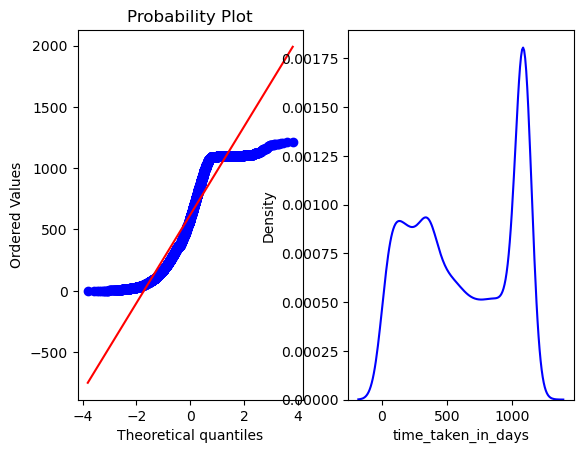

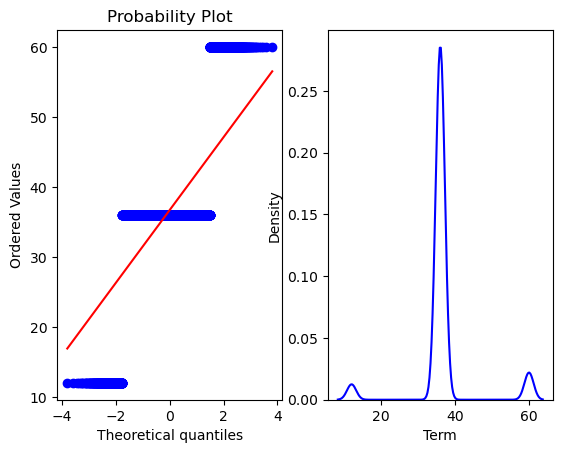

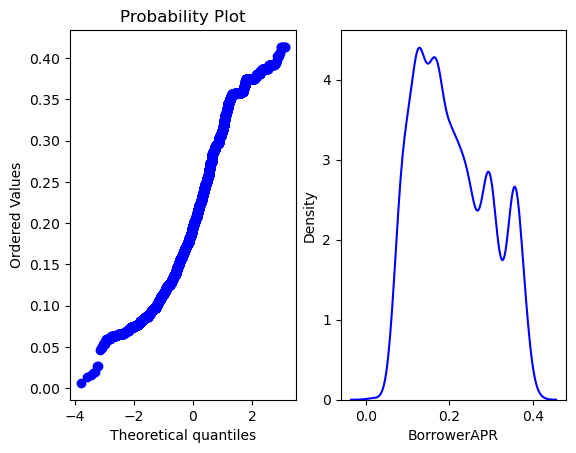

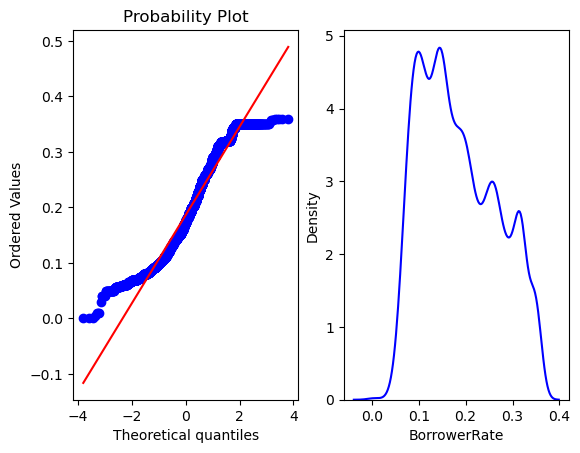

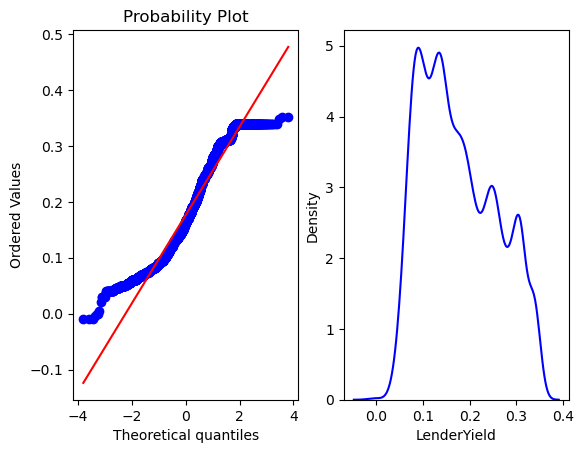

...

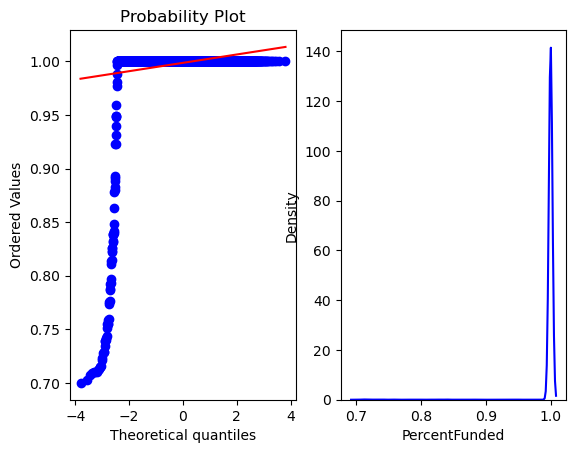

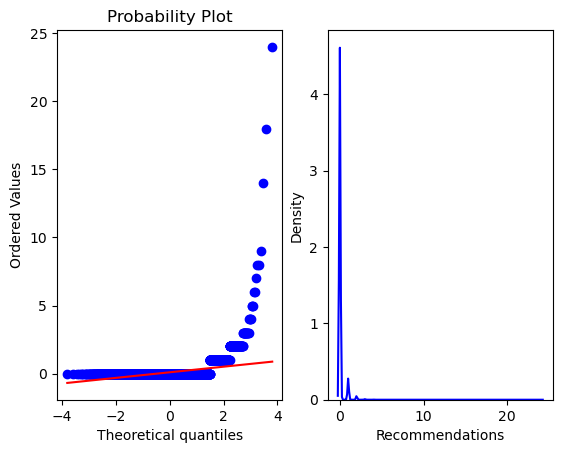

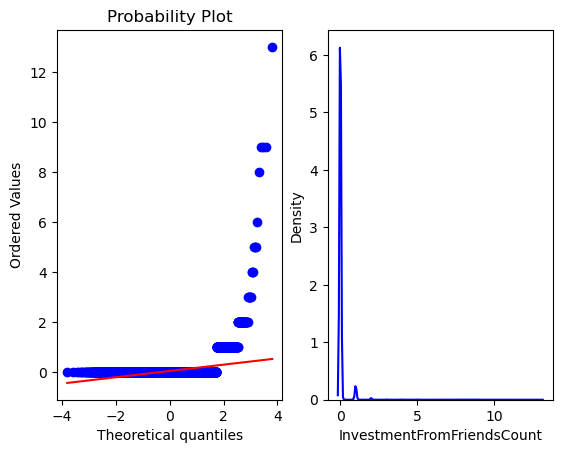

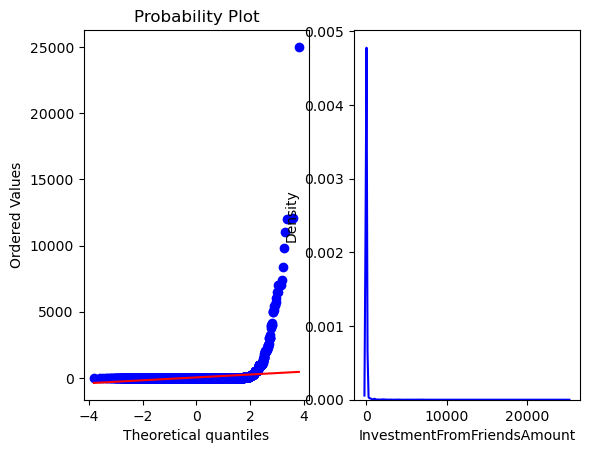

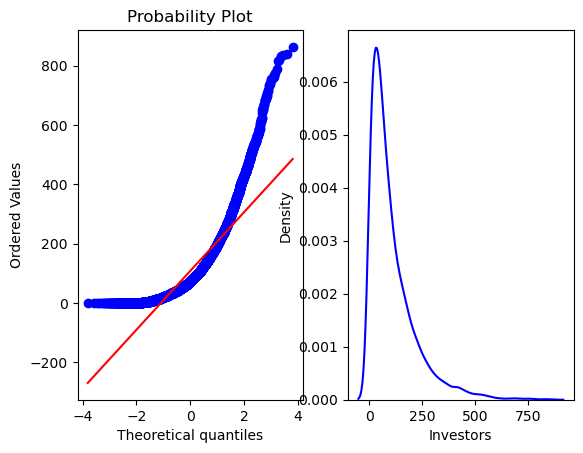

In [137]:
for column in numerical_columns:
        
    plt.figure()
    
    plt.subplot(121)
    scipy.stats.probplot(df[column], dist = 'norm', plot = plt)
    
    plt.subplot(122)
    sns.kdeplot(data = df, x = column, color = 'blue',)

### Outliers

In [138]:
for column in numerical_columns:
    
    iqr = df[column].quantile(0.75) - df[column].quantile(0.25)
    
    upper_limit = (1.5 * iqr) + df[column].quantile(0.75)
    lower_limit = (1.5*iqr) - df[column].quantile(0.25)
    
    outliers = df.loc[np.where(df[column] > upper_limit, True, np.where(df[column] < lower_limit, True, False))]
    
    print(f'Number of outliers in {len(outliers)}: {column}')

Number of outliers in 6647: time_taken_in_days
Number of outliers in 686: Term
Number of outliers in 815: BorrowerAPR
Number of outliers in 763: BorrowerRate
Number of outliers in 1662: LenderYield
Number of outliers in 1696: EstimatedEffectiveYield
Number of outliers in 2484: EstimatedLoss
Number of outliers in 55: EstimatedReturn
Number of outliers in 0: ProsperRating (numeric)
Number of outliers in 0: ProsperScore
Number of outliers in 8341: ListingCategory (numeric)
Number of outliers in 7218: EmploymentStatusDuration
Number of outliers in 0: CreditScoreRangeLower
Number of outliers in 0: CreditScoreRangeUpper
Number of outliers in 1574: CurrentCreditLines
Number of outliers in 1378: OpenCreditLines
Number of outliers in 1723: TotalCreditLinespast7years
Number of outliers in 4393: OpenRevolvingAccounts
Number of outliers in 8450: OpenRevolvingMonthlyPayment
Number of outliers in 8304: InquiriesLast6Months
Number of outliers in 7106: TotalInquiries
Number of outliers in 2121: Curren

### Heteroscedasticity

In [135]:
import statsmodels.api as sm
from patsy import dmatrices

In [151]:
temp = df[numerical_columns.tolist() + categorical_columns]
temp = pd.get_dummies(temp)

x_temp = temp.drop([target], axis = 1)
y_temp = temp[target]

In [152]:
# formula = f'{target} ~ '

# for column in temp.columns:
    
#     if column in categorical_columns:
        
#         formula = formula + f'C({str(column)}) + '
        
#     if column in numerical_columns and column != target:
        
#         formula = formula + f'{column} + '
        
# formula = formula[:-3]
# formula

In [154]:
# xtrain_temp, ytrain_temp = dmatrices(formula, data = temp.fillna(0), return_type = 'dataframe')

model = sm.OLS(y_temp, x_temp.fillna(0)).fit()

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     time_taken_in_days   R-squared:                       0.622
Model:                            OLS   Adj. R-squared:                  0.599
Method:                 Least Squares   F-statistic:                     27.54
Date:                Sun, 24 Dec 2023   Prob (F-statistic):               0.00
Time:                        14:37:17   Log-Likelihood:                -68738.
No. Observations:               10000   AIC:                         1.386e+05
Df Residuals:                    9435   BIC:                         1.427e+05
Df Model:                         564                                         
Covariance Type:            nonrobust                                         
=================================================================================================================
                                                    coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------
Term                                             -2.0430      0.562     -3.637      0.000      -3.144      -0.942
BorrowerAPR                                   -1069.2543    377.445     -2.833      0.005   -1809.128    -329.380
BorrowerRate                                  -3381.8712   1084.984     -3.117      0.002   -5508.673   -1255.069
LenderYield                                    3341.6213   1031.175      3.241      0.001    1320.297    5362.946
EstimatedEffectiveYield                        -273.6272    145.337     -1.883      0.060    -558.519      11.264
EstimatedLoss                                  -117.0933    291.476     -0.402      0.688    -688.449     454.263
EstimatedReturn                                 354.4734    223.742      1.584      0.113     -84.109     793.056
ProsperRating (numeric)                          -1.4122     11.891     -0.119      0.905     -24.721      21.897
ProsperScore                                      3.4312      3.000      1.144      0.253      -2.450       9.313
ListingCategory (numeric)                         0.1760      0.819      0.215      0.830      -1.429       1.781
EmploymentStatusDuration                          0.0668      0.034      1.980      0.048       0.001       0.133
CreditScoreRangeLower                           -11.6747      3.821     -3.055      0.002     -19.165      -4.184
CreditScoreRangeUpper                            11.3580      3.753      3.026      0.002       4.001      18.715
CurrentCreditLines                                0.4994      1.848      0.270      0.787      -3.122       4.121
OpenCreditLines                                   4.0092      2.137      1.876      0.061      -0.179       8.198
TotalCreditLinespast7years                       -0.4764      0.432     -1.102      0.270      -1.324       0.371
OpenRevolvingAccounts                            -0.8607      1.201     -0.717      0.473      -3.214       1.493
OpenRevolvingMonthlyPayment                       0.0248      0.011      2.314      0.021       0.004       0.046
InquiriesLast6Months                             -1.5537      1.468     -1.059      0.290      -4.431       1.323
TotalInquiries                                   -0.7835      0.578     -1.356      0.175      -1.916       0.349
CurrentDelinquencies                              5.3413      1.719      3.107      0.002       1.971       8.712
AmountDelinquent                                 -0.0001      0.000     -0.329      0.742      -0.001       0.001
DelinquenciesLast7Years                           1.2644      0.312      4.056      0.000       0.653       1.875
PublicRecordsLast10Years                          7.5890      4.140      1.833      0.067      -0.526      15.704
Publi

#### Identifying heteroskedasticity

When examining this kind of plot, we’re looking for any distinct, observable patterns among the residuals. For example, if the residuals increase or decrease systematically as the fitted values increase, this may indicate that the model is missing some important linear or nonlinear relationship in the data.

In [159]:
x_temp[:3]

,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperScore,ListingCategory (numeric),EmploymentStatusDuration,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,CreditGrade_A,CreditGrade_AA,CreditGrade_B,CreditGrade_C,CreditGrade_D,CreditGrade_E,CreditGrade_HR,CreditGrade_NC,LoanStatus_Completed,ProsperRating (Alpha)_A,ProsperRating (Alpha)_AA,ProsperRating (Alpha)_B,ProsperRating (Alpha)_C,ProsperRating (Alpha)_D,ProsperRating (Alpha)_E,ProsperRating (Alpha)_HR,BorrowerState_AK,BorrowerState_AL,BorrowerState_AR,BorrowerState_AZ,BorrowerState_CA,BorrowerState_CO,BorrowerState_CT,BorrowerState_DC,BorrowerState_DE,BorrowerState_FL,BorrowerState_GA,BorrowerState_HI,BorrowerState_IA,BorrowerState_ID,BorrowerState_IL,BorrowerState_IN,BorrowerState_KS,BorrowerState_KY,BorrowerState_LA,BorrowerState_MA,BorrowerState_MD,BorrowerState_ME,BorrowerState_MI,BorrowerState_MN,BorrowerState_MO,BorrowerState_MS,BorrowerState_MT,BorrowerState_NC,BorrowerState_ND,BorrowerState_NE,BorrowerState_NH,BorrowerState_NJ,BorrowerState_NM,BorrowerState_NV,BorrowerState_NY,BorrowerState_OH,BorrowerState_OK,BorrowerState_OR,BorrowerState_PA,BorrowerState_RI,BorrowerState_SC,BorrowerState_SD,BorrowerState_TN,BorrowerState_TX,BorrowerState_UT,BorrowerState_VA,BorrowerState_VT,BorrowerState_WA,BorrowerState_WI,BorrowerState_WV,BorrowerState_WY,Occupation_Accountant/CPA,Occupation_Administrative Assistant,Occupation_Analyst,Occupation_Architect,Occupation_Attorney,Occupation_Biologist,Occupation_Bus Driver,Occupation_Car Dealer,Occupation_Chemist,Occupation_Civil Service,Occupation_Clergy,Occupation_Clerical,Occupation_Computer Programmer,Occupation_Construction,Occupation_Dentist,Occupation_Doctor,Occupation_Engineer - Chemical,Occupation_Engineer - Electrical,Occupation_Engineer - Mechanical,Occupation_Executive,Occupation_Fireman,Occupation_Flight Attendant,Occupation_Food Service,Occupation_Food Service Management,Occupation_Homemaker,Occupation_Investor,Occupation_Laborer,Occupation_Landscaping,Occupation_Medical Technician,Occupation_Military Enlisted,Occupation_Military Officer,Occupation_Nurse (LPN),Occupation_Nurse (RN),Occupation_Nurse's Aide,Occupation_Other,Occupation_Pharmacist,Occupation_Pilot - Private/Commercial,Occupation_Police Officer/Correction Officer,Occupation_Postal Service,Occupation_Principal,Occupation_Professional,Occupation_Professor,Occupation_Psychologist,Occupation_Realtor,Occupation_Religious,Occupation_Retail Management,Occupation_Sales - Commission,Occupation_Sales - Retail,Occupation_Scientist,Occupation_Skilled Labor,Occupation_Social Worker,Occupation_Student - College Freshman,Occupation_Student - College Graduate Student,Occupation_Student - College Junior,Occupation_Student - College Senior,Occupation_Student - College Sophomore,Occupation_Student - Community College,Occupation_Teacher,Occupation_Teacher's Aide,Occupation_Trades

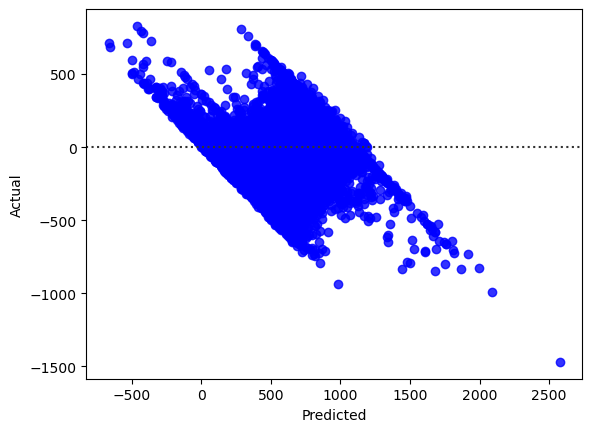

In [160]:
pred_temp = model.predict(x_temp.fillna(0))

residuals = temp[target] - pred_temp

sns.residplot(x = pred_temp, y = residuals, color = 'blue')
plt.xlabel('Predicted');plt.ylabel('Actual');

### Regression Analysis

1. Is there a relationship between all variables and target variable?
 
 Using the f-statistic with null hypothesis: All betas are 0.
 The pvalue is less than 0.05 and f-statistic id greater than 1. There is a relationhsip.

2. How strong is the relationship?

 Using the R2 score, we notice an adjusted r2 score of 0.599 for the model. This means our independent variables only explain 59.9% for the variability of our target variable. 

3. Which variables are related to the target?

 Using the t-statistic and pvalues score, we notice some values are related and some are not.

In [165]:
variables_pvalues = {column: pvalue for column, pvalue in zip(x_temp.columns, model.pvalues) if pvalue < 0.05}
variables_pvalues

{'Term': 0.0002770735963236119,
 'BorrowerAPR': 0.004622955270994737,
 'BorrowerRate': 0.0018326363847046654,
 'LenderYield': 0.001196932602693229,
 'EmploymentStatusDuration': 0.047681109920309016,
 'CreditScoreRangeLower': 0.002254954755127197,
 'CreditScoreRangeUpper': 0.0024841192581914573,
 'OpenRevolvingMonthlyPayment': 0.020694981119828898,
 'CurrentDelinquencies': 0.0018987061139929037,
 'DelinquenciesLast7Years': 5.0244725791195396e-05,
 'RevolvingCreditBalance': 5.5849910894189314e-05,
 'AvailableBankcardCredit': 1.1443040625262071e-05,
 'TradesNeverDelinquent (percentage)': 0.002135936717450553,
 'TotalProsperLoans': 1.7489090490745729e-09,
 'LoanFirstDefaultedCycleNumber': 0.01057753690133884,
 'MonthlyLoanPayment': 2.8111540047576166e-19,
 'LP_CustomerPayments': 8.396531463337393e-06,
 'LP_CustomerPrincipalPayments': 0.00013197376815462212,
 'LP_InterestandFees': 3.982288407976101e-29,
 'LP_ServiceFees': 5.2057531989690395e-103,
 'LP_CollectionFees': 0.01775383782728604,
 

## Data Cleaning

### Clean column names - 
Replace ' ' with _

In [167]:
train.columns = [x.replace(' ', '_') for x in train.columns]


test.columns = [x.replace(' ', '_') for x in test.columns]


validation.columns = [x.replace(' ', '_') for x in validation.columns]

In [199]:
train.columns

Index(['time_taken_in_days', 'ListingCreationDate', 'CreditGrade',
       'LoanStatus', 'ClosedDate', 'BorrowerAPR', 'EstimatedLoss',
       'ProsperRating_(Alpha)', 'ProsperScore', 'ListingCategory_(numeric)',
       'BorrowerState', 'Occupation', 'EmploymentStatus',
       'EmploymentStatusDuration', 'IsBorrowerHomeowner', 'CurrentlyInGroup',
       'DateCreditPulled', 'FirstRecordedCreditLine', 'OpenCreditLines',
       'OpenRevolvingAccounts', 'OpenRevolvingMonthlyPayment',
       'InquiriesLast6Months', 'TotalInquiries', 'CurrentDelinquencies',
       'AmountDelinquent', 'DelinquenciesLast7Years',
       'PublicRecordsLast10Years', 'PublicRecordsLast12Months',
       'RevolvingCreditBalance', 'BankcardUtilization',
       'AvailableBankcardCredit', 'TotalTrades', 'TradesOpenedLast6Months',
       'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable',
       'StatedMonthlyIncome', 'LoanCurrentDaysDelinquent',
       'LoanOriginalAmount', 'LoanOriginationDate', 'LoanOriginationQuar

In [222]:
def drop_high_low_cardinality_columns(dataframe):
    
    """Drop columns with low cardinality(unique value of 1) and high cardinality(unique value greater than 10)"""
    
    for column in dataframe:
        
        dataframe.drop([column], axis = 1, inplace  = True)
        
    return dataframe

func_drop_high_low_cardinality_columns = FunctionTransformer(drop_high_low_cardinality_columns)
columns_drop_high_low_cardinality_columns = ['LoanStatus', 'BorrowerState', 'ProsperRating_(Alpha)']

In [223]:
df['Occupation'].unique()

array(['Other', 'Computer Programmer', 'Truck Driver', 'Analyst',
       'Professional', 'Landscaping', 'Executive', 'Military Enlisted',
       'Realtor', 'Social Worker', 'Tradesman - Electrician',
       'Skilled Labor', nan, 'Administrative Assistant', 'Nurse (RN)',
       'Police Officer/Correction Officer', 'Sales - Retail', 'Teacher',
       'Civil Service', 'Food Service', 'Clerical', 'Retail Management',
       'Attorney', 'Student - College Senior', 'Accountant/CPA',
       'Biologist', 'Sales - Commission', 'Laborer', 'Doctor',
       'Engineer - Electrical', 'Waiter/Waitress', 'Tradesman - Mechanic',
       'Engineer - Chemical', 'Bus Driver', 'Engineer - Mechanical',
       "Nurse's Aide", 'Tradesman - Plumber', 'Food Service Management',
       'Military Officer', 'Pharmacist', 'Fireman', 'Scientist',
       'Medical Technician', 'Pilot - Private/Commercial', 'Architect',
       'Professor', 'Student - College Graduate Student',
       'Postal Service', 'Clergy', 'Student

In [224]:
def reduce_cardinality_occupation(dataframe):
    
    '''Reduce cardinality of occupation'''
    
    for column in dataframe:
        
        dataframe[column] = dataframe[column].replace({
            'Other': 'Other',
            'Computer Programmer': 'Tech',
            'Truck Driver': 'Driver',
            'Analyst': 'Professional',
            'Professional': 'Professional',
            'Landscaping': 'Blue Collar',
            'Executive': 'Executive',
            'Military Enlisted': 'Military',
            'Realtor': 'Real Estate',
            'Social Worker': 'Social Services',
            'Tradesman - Electrician': 'Blue Collar',
            'Skilled Labor': 'Blue Collar',
            'Administrative Assistant': 'Clerical',
            'Nurse (RN)': 'Healthcare',
            'Police Officer/Correction Officer': 'Law Enforcement',
            'Sales - Retail': 'Sales',
            'Teacher': 'Education',
            'Civil Service': 'Government',
            'Food Service': 'Service',
            'Clerical': 'Clerical',
            'Retail Management': 'Management',
            'Attorney': 'Legal',
            'Student - College Senior': 'Student',
            'Accountant/CPA': 'Financial',
            'Biologist': 'Science',
            'Sales - Commission': 'Sales',
            'Laborer': 'Blue Collar',
            'Doctor': 'Healthcare',
            'Engineer - Electrical': 'Engineering',
            'Waiter/Waitress': 'Service',
            'Tradesman - Mechanic': 'Blue Collar',
            'Engineer - Chemical': 'Engineering',
            'Bus Driver': 'Driver',
            'Engineer - Mechanical': 'Engineering',
            "Nurse's Aide": 'Healthcare',
            'Tradesman - Plumber': 'Blue Collar',
            'Food Service Management': 'Management',
            'Military Officer': 'Military',
            'Pharmacist': 'Healthcare',
            'Fireman': 'Emergency Services',
            'Scientist': 'Science',
            'Medical Technician': 'Healthcare',
            'Pilot - Private/Commercial': 'Aviation',
            'Architect': 'Architecture',
            'Professor': 'Education',
            'Student - College Graduate Student': 'Student',
            'Postal Service': 'Government',
            'Clergy': 'Religious',
            'Student - College Sophomore': 'Student',
            'Construction': 'Blue Collar',
            "Teacher's Aide": 'Education',
            'Homemaker': 'Other',
            'Psychologist': 'Healthcare',
            'Student - College Junior': 'Student',
            'Nurse (LPN)': 'Healthcare',
            'Flight Attendant': 'Aviation',
            'Investor': 'Other',
            'Car Dealer': 'Sales',
            'Principal': 'Education',
            'Religious': 'Religious',
            'Dentist': 'Healthcare',
            'Tradesman - Carpenter': 'Blue Collar',
            'Chemist': 'Science',
            'Student - College Freshman': 'Student',
            'Student - Community College': 'Student'
            
                })
        
    return dataframe

func_reduce_cardinality_occupation = FunctionTransformer(reduce_cardinality_occupation)
reduce_cardinality_occupation_columns = ['Occupation']

In [203]:
#[col for col in df.columns if 'employment' in col.lower()]

df['EmploymentStatus'].unique()


array(['Full-time', 'Employed', 'Not available', nan, 'Self-employed',
       'Other', 'Retired', 'Not employed', 'Part-time'], dtype=object)

In [225]:
def reduce_cardinality_employment(dataframe):
    
    '''Reduce cardinality of employment status'''
    
    for column in dataframe:
        
        dataframe[column] = dataframe[column].replace({
            'Full-time':'Yes',
            'Employed':'Yes',
            'Not available':np.nan,
            'Self-employed': 'Yes',
            'Other':'No',
            'Retired':'No',
            'Not employed':'No',
            'Part-time': 'Yes'
        })
        
    return dataframe

func_reduce_cardinality_employment = FunctionTransformer(reduce_cardinality_employment)
reduce_cardinality_employment_columns = ['EmploymentStatus']

In [205]:
#[col for col in df.columns if 'income' in col.lower()]

df['IncomeRange'].unique()

array(['$1-24,999', '$75,000-99,999', '$100,000+', 'Not displayed',
       '$50,000-74,999', '$25,000-49,999', '$0', 'Not employed'],
      dtype=object)

In [229]:
def reduce_cardinality_income_status(dataframe):
    
    '''Reduce cardinality of income range'''
    
    for column in dataframe:
        
        dataframe[column] = dataframe[column].replace({
            'Not displayed':np.nan,
            'Not employed': '$0'
        })
        
    return dataframe

func_reduce_cardinality_income_status = FunctionTransformer(reduce_cardinality_income_status)
reduce_cardinality_income_status_columns = ['IncomeRange']

In [230]:
def split_loan_origination_quarter(dataframe):
    
    '''Split column into two - quarter and year'''
    
    for column in dataframe:
        
        dataframe[f'{column}_quarter'] = dataframe[column].str.split(expand = True)[0]
        
        dataframe[f'{column}_year'] = dataframe[column].str.split(expand = True)[1]
        
        dataframe.drop([column], axis = 1, inplace = True)
        
    return dataframe

func_split_loan_origination_quarter = FunctionTransformer(split_loan_origination_quarter)
split_loan_origination_quarter_columns = ['LoanOriginationQuarter']

In [231]:
data_cleaning_pipeline = ColumnTransformer([
    ('func_drop_high_low_cardinality_columns',func_drop_high_low_cardinality_columns , columns_drop_high_low_cardinality_columns),
    ('func_reduce_cardinality_occupation',func_reduce_cardinality_occupation , reduce_cardinality_occupation_columns),
    ('func_reduce_cardinality_employment',func_reduce_cardinality_employment , reduce_cardinality_employment_columns),
    ('func_reduce_cardinality_income_status',func_reduce_cardinality_income_status , reduce_cardinality_income_status_columns),
    ('func_split_loan_origination_quarter',func_split_loan_origination_quarter , split_loan_origination_quarter_columns),
    
],remainder = 'passthrough', verbose_feature_names_out = False)

In [184]:
to_drop_high_multicollinearity = [x.replace(' ', '_') for x in to_drop_high_multicollinearity]

In [185]:
# drop columns with high_multicollinearity

train = train.drop(to_drop_high_multicollinearity, axis = 1)

test = test.drop(to_drop_high_multicollinearity, axis = 1)

validation = validation.drop(to_drop_high_multicollinearity, axis = 1)

In [189]:
high_nan_values = [x.replace(' ', '_') for x in high_nan_values if x not in to_drop_high_multicollinearity]

In [190]:
# drop columns with high nan columns

train = train.drop(high_nan_values, axis = 1)

test = test.drop(high_nan_values, axis = 1)

validation = validation.drop(high_nan_values, axis = 1)

In [192]:
train[:2]

,time_taken_in_days,ListingCreationDate,CreditGrade,LoanStatus,ClosedDate,BorrowerAPR,EstimatedLoss,ProsperRating_(Alpha),ProsperScore,ListingCategory_(numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,DateCreditPulled,FirstRecordedCreditLine,OpenCreditLines,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,LoanCurrentDaysDelinquent,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
21663,443.0,2010-10-29 23:01:55.623000000,NaN,Completed,2012-02-29 00:00:00,0.39153,0.183,HR,5.0,1,WA,Tradesman - Mechanic,Employed,30.0,False,False,2010-12-01 21:48:52,2000-11-22 00:00:00,4.0,3,184.0,3.0,7.0,0.0,0.0,16.0,1.0,0.0,5765.0,0.99,57.0,24.0,0.0,0.08,"$25,000-49,999",True,3206.666667,0,1500,2010-12-13 00:00:00,Q4 2010,-15.98,0.0,0.0,0.0,0.0,0,0,0.0,33
35320,1095.0,2008-03-28 10:45:55.370000000,A,Completed,2011-07-09 00:00:00,0.19523,NaN,NaN,NaN,3,DE,Computer Programmer,Full-time,60.0,True,False,2008-06-26 19:50:46.740000000,1993-01-19 00:00:00,23.0,19,651.0,5.0,10.0,0.0,0.0,4.0,1.0,0.0,51186.0,0.83,9289.0,41.0,2.0,0.34,"$50,000-74,999",True,5416.666667,0,9000,2008-07-09 00:00:00,Q3 2008,-151.09,0.0,0.0,0.0,0.0,0,0,0.0,85


In [193]:
# # merge 'CreditScoreRangeLower', 'CreditScoreRangeUpper'

# train['CreditScoreRange'] = train['CreditScoreRangeUpper'] - train['CreditScoreRangeLower']
# train = train.drop(['CreditScoreRangeUpper', 'CreditScoreRangeLower'], axis = 1)

In [195]:
# test['CreditScoreRange'] = test['CreditScoreRangeUpper'] - test['CreditScoreRangeLower']
# test = test.drop(['CreditScoreRangeUpper', 'CreditScoreRangeLower'], axis = 1)

In [196]:
# validation['CreditScoreRange'] = validation['CreditScoreRangeUpper'] - validation['CreditScoreRangeLower']
# validation = validation.drop(['CreditScoreRangeUpper', 'CreditScoreRangeLower'], axis = 1)

In [232]:
xtrain, ytrain = train.drop([target], axis = 1),     train[target]

xtest, ytest = test.drop([target], axis = 1),     test[target]

xvalidation, yvalidation = validation.drop([target], axis = 1),     validation[target]

In [233]:
xtrain = data_cleaning_pipeline.fit_transform(xtrain)

xtest = data_cleaning_pipeline.transform(xtest)

xvalidation = data_cleaning_pipeline.transform(xvalidation)

In [234]:
xtrain[:3]

,Occupation,EmploymentStatus,IncomeRange,LoanOriginationQuarter_quarter,LoanOriginationQuarter_year,ListingCreationDate,CreditGrade,ClosedDate,BorrowerAPR,EstimatedLoss,ProsperScore,ListingCategory_(numeric),EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,DateCreditPulled,FirstRecordedCreditLine,OpenCreditLines,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesOpenedLast6Months,DebtToIncomeRatio,IncomeVerifiable,StatedMonthlyIncome,LoanCurrentDaysDelinquent,LoanOriginalAmount,LoanOriginationDate,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
21663,Blue Collar,Yes,"$25,000-49,999",Q4,2010,2010-10-29 23:01:55.623000000,NaN,2012-02-29 00:00:00,0.39153,0.183,5.0,1,30.0,False,False,2010-12-01 21:48:52,2000-11-22 00:00:00,4.0,3,184.0,3.0,7.0,0.0,0.0,16.0,1.0,0.0,5765.0,0.99,57.0,24.0,0.0,0.08,True,3206.666667,0,1500,2010-12-13 00:00:00,-15.98,0.0,0.0,0.0,0.0,0,0,0.0,33
35320,Tech,Yes,"$50,000-74,999",Q3,2008,2008-03-28 10:45:55.370000000,A,2011-07-09 00:00:00,0.19523,NaN,NaN,3,60.0,True,False,2008-06-26 19:50:46.740000000,1993-01-19 00:00:00,23.0,19,651.0,5.0,10.0,0.0,0.0,4.0,1.0,0.0,51186.0,0.83,9289.0,41.0,2.0,0.34,True,5416.666667,0,9000,2008-07-09 00:00:00,-151.09,0.0,0.0,0.0,0.0,0,0,0.0,85
19473,NaN,NaN,NaN,Q3,2006,2006-09-22 14:22:50.710000000,HR,2009-10-09 00:00:00,0.30962,NaN,NaN,0,NaN,True,False,2006-09-22 14:19:12.027000000,1996-10-05 00:00:00,NaN,2,0.0,3.0,5.0,9.0,NaN,19.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,0.01,True,6666.666667,0,1000,2006-09-28 00:00:00,-8.40,0.0,0.0,0.0,0.0,0,0,0.0,9


## Baseline Model

In [237]:
dummy = DummyRegressor()

temp_xtrain = pd.get_dummies(xtrain)

dummy.fit(temp_xtrain.fillna(0), ytrain)

dummy_pred = dummy.predict(temp_xtrain)

In [340]:
baseline =  pd.DataFrame({
        #'Models':'Baseline',
        'R2':r2_score(ytrain,dummy_pred),
        'RMSE': np.sqrt(mean_squared_error(ytrain,dummy_pred)),
        'MAE':mean_absolute_error(ytrain,dummy_pred)
    }, index = ['Baseline'])

baseline

,R2,RMSE,MAE
Baseline,0.0,381.107738,344.132665


## Model Selection

In [337]:
models = []

models.append( ('Elasticnet', ElasticNet()) )
models.append( ('Tree', DecisionTreeRegressor()) )
models.append( ('KNN', KNeighborsRegressor()) )
models.append( ('Forest', RandomForestRegressor()) )
models.append( ('Adaboost', AdaBoostRegressor()) )
models.append( ('Extra trees', ExtraTreesRegressor()) )

In [370]:
def evaluate(xtrain, ytrain, experiment_number):
    names, r2, rmse, mae = [], [], [], []

    cv = KFold(shuffle=True, n_splits=3)

    for name, model in models:
        names.append(name)

        r2_ = cross_val_score(model, xtrain, ytrain, cv=cv, scoring='r2')
        r2.append(r2_.mean())

        rmse_ = -cross_val_score(model, xtrain, ytrain, cv=cv, scoring='neg_mean_squared_error')
        rmse.append(np.sqrt(rmse_.mean()))

        mae_ = -cross_val_score(model, xtrain, ytrain, cv=cv, scoring='neg_mean_absolute_error')
        mae.append(mae_.mean())

        ypred = cross_val_predict(model, xtrain, ytrain, cv=cv)

        results = pd.DataFrame({
            'Actual': ytrain,
            'Predicted': ypred,
            'Residuals': ytrain - ypred,
            'Diff_%': np.abs((ytrain - ypred) / ytrain) * 100
        })

        sns.residplot(x=results['Residuals'], y=results['Predicted'], color='blue')
        plt.title(f'Residuals for {name}')
        plt.show()

    metrics = pd.DataFrame({
        'Models': names,
        'R2': r2,
        'RMSE': rmse,
        'MAE': mae
    })

    metrics.index = [f'{model}_{experiment_number}' for model in metrics['Models']]
    metrics.drop(['Models'], axis=1, inplace=True)

    return metrics

## Experiment 0

1. Missing values: SimpleImputer
2. Encoding: One-hot
3. Transformation: Log
4. Outliers: None
5. Scaling: StandardScaler
6. Feature Selection: RFE(ElasticNet)

In [371]:
date_cols = ['ListingCreationDate', 'ClosedDate', 'DateCreditPulled', 'FirstRecordedCreditLine', 'LoanOriginationDate']
 

for column in date_cols:
    xtrain[column] = pd.to_datetime(xtrain[column])

In [372]:
xtrain_0, ytrain_0 = xtrain.copy(), ytrain.copy()

In [373]:
num_imputer = SimpleImputer(strategy = 'median')

cat_imputer = SimpleImputer(strategy = 'most_frequent')

In [374]:
encoder = OneHotEncoder()

In [375]:
scaler = StandardScaler()

In [376]:
def log_transformer(dataframe):
    
    for column in dataframe:
        
        if 0 in dataframe[column]:
            
            dataframe[column] = dataframe[column].apply(np.log1p)
            
        else:
            
            dataframe[column] = dataframe[column].apply(np.log)
            
    return dataframe

func_log_transformer = FunctionTransformer(log_transformer)

In [377]:
def date_transformer(dataframe):
    
    
    for column in dataframe:
        
        dataframe[f'{column}_month'] = dataframe[column].dt.month
        dataframe[f'{column}_year'] = dataframe[column].dt.year
        dataframe[f'{column}_day'] = dataframe[column].dt.day
        
        dataframe.drop([column], axis = 1, inplace = True)
        
    return dataframe
        
       
func_date_transformer = FunctionTransformer(date_transformer)

In [378]:
num_columns = xtrain_0.select_dtypes('number').columns
cat_columns = xtrain_0.select_dtypes('O').columns





num_pipeline = Pipeline([
    
    ('imputer', num_imputer),
    ('scaler', scaler),
    ('transformer', func_log_transformer),
    ('imputer_2', num_imputer),

])

cat_pipeline = Pipeline([
    ('imputer', cat_imputer),
    ('encoder',encoder)
])


date_pipeline = Pipeline([
    ('date', func_date_transformer),
    ('imputer_2', num_imputer),
  
])


preprocessing_pipeline = ColumnTransformer([
    ('num', num_pipeline, num_columns),
    ('cat', cat_pipeline, cat_columns),
    ('date', date_pipeline, date_cols)
])

xtrain_0 = preprocessing_pipeline.fit_transform(xtrain_0)
xtrain_0.shape

(22844, 105)

In [379]:
rfe = RFE(ElasticNet()).fit(xtrain_0, ytrain_0)
f'{len(xtrain_0.columns[rfe.get_support()])} chosen out of {len(xtrain_0.columns)}'

'52 chosen out of 105'

In [380]:
selected_columns_0 = xtrain_0.columns[rfe.get_support()]

xtrain_0 = xtrain_0[selected_columns_0]

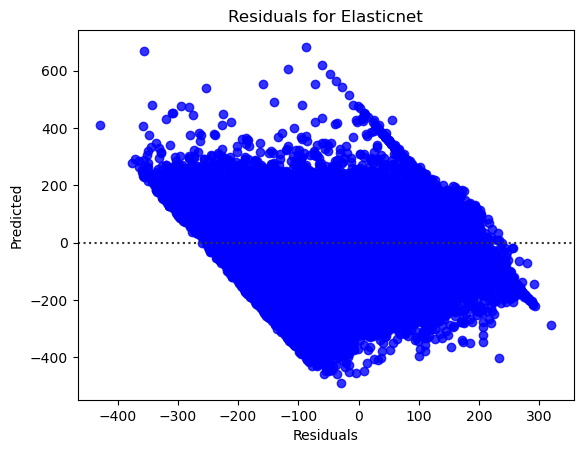

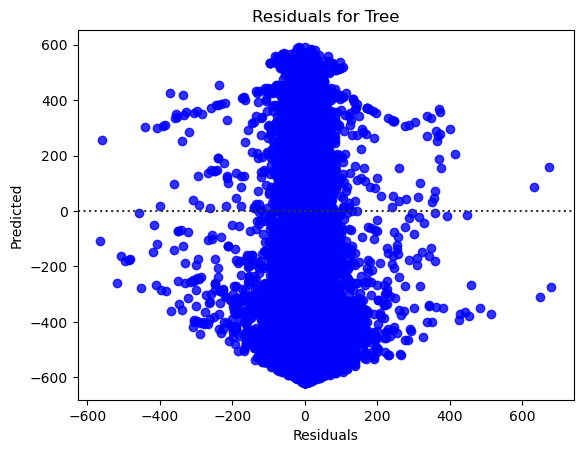

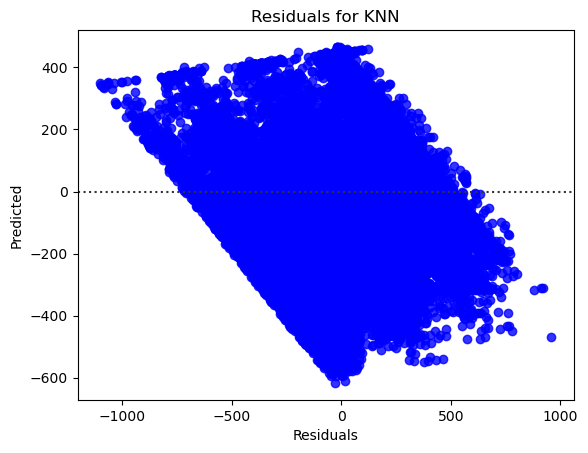

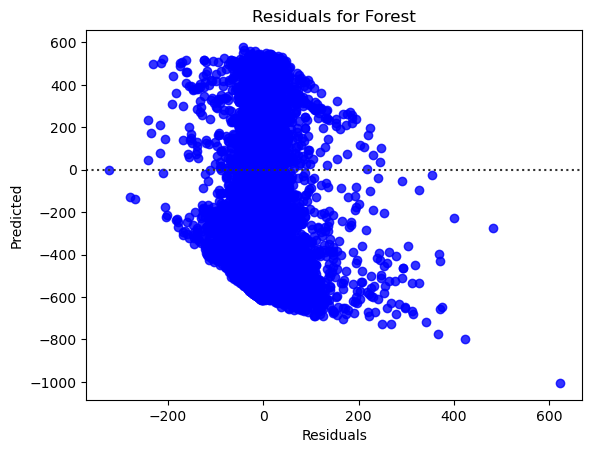

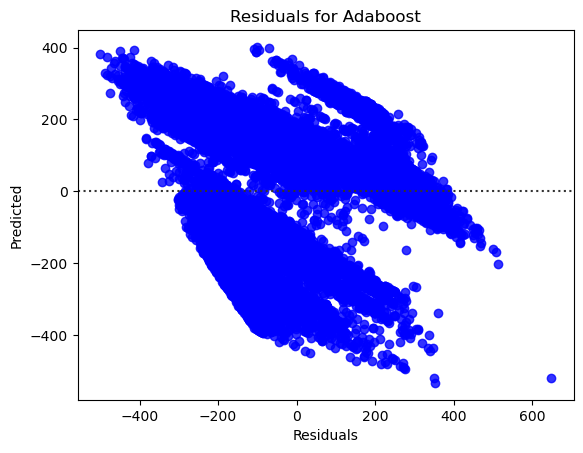

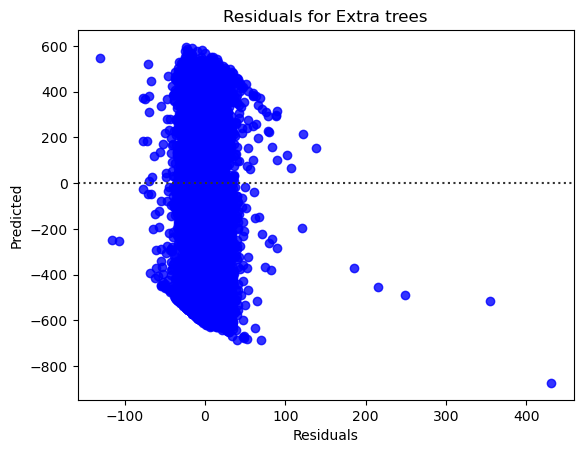

,R2,RMSE,MAE
Elasticnet_0,0.853960,145.653698,125.397288
Tree_0,0.983308,49.658232,26.253828
KNN_0,0.427359,286.936248,219.547883
Forest_0,0.991640,34.518446,19.800831
Adaboost_0,0.696921,206.258833,182.249547
Extra trees_0,0.998721,13.338100,8.756592


In [381]:
metrics_0 = evaluate(xtrain_0, ytrain_0, 0)
metrics_0

## Experiment 1

1. Missing values: Imputer with values at the end of the dist
2. Encoding: Count
3. Transformation: cube root
4. Outliers: winsorize q95 to q5
5. Scaling: MaxabsScaler
6. Feature Selection: F-Regression

In [382]:
xtrain_1, ytrain_1 = xtrain.copy(),    ytrain.copy()

In [383]:
def imputer_end_of_dist(dataframe):
    
    
    for column in dataframe:
        
        upper_limit = dataframe[column].quantile(0.75)
        
        dataframe[column] = dataframe[column].fillna(upper_limit)
        
    return dataframe

func_imputer_end_of_dist = FunctionTransformer(imputer_end_of_dist)

In [384]:
def count_encoder(dataframe):
    
    
    for column in dataframe:
        
        values = dataframe[column].value_counts(normalize = True).to_dict()
        
        dataframe[column] = dataframe[column].map(values)
        
    return dataframe

func_count_encoder = FunctionTransformer(count_encoder)

In [385]:
transformer  = FunctionTransformer(np.cbrt)


scaler = MaxAbsScaler()

In [386]:
def winsorize(dataframe):
    
    for column in dataframe:
        
        upper_limit = dataframe[column].quantile(0.95)
        lower_limit = dataframe[column].quantile(0.05)
        
        
        dataframe[column] = np.where(dataframe[column] > upper_limit, upper_limit, np.where(dataframe[column] < lower_limit, lower_limit, dataframe[column]))
        
        
    return dataframe

func_winsorize = FunctionTransformer(winsorize)

In [387]:
num_columns = xtrain_1.select_dtypes('number').columns
cat_columns = xtrain_1.select_dtypes('O').columns





num_pipeline = Pipeline([
    
    ('imputer', func_imputer_end_of_dist),
    ('scaler', scaler),
    ('transformer', transformer),
    ('winsorize', func_winsorize),
    ('imputer_2', func_imputer_end_of_dist),

])

cat_pipeline = Pipeline([
    ('imputer', cat_imputer),
    ('encoder',func_count_encoder)
])


date_pipeline = Pipeline([
    ('date', func_date_transformer),
    ('imputer_2', func_imputer_end_of_dist),
  
])


preprocessing_pipeline = ColumnTransformer([
    ('num', num_pipeline, num_columns),
    ('cat', cat_pipeline, cat_columns),
    ('date', date_pipeline, date_cols)
])

xtrain_1 = preprocessing_pipeline.fit_transform(xtrain_1)
xtrain_1.shape

(22844, 54)

In [388]:
# 6. Feature Selection: F-Regression

fstatistic, pvalues = f_regression(xtrain_1, ytrain_1,)
selected_columns_1 = [column for column, pvalue in zip(xtrain_1.columns,pvalues) if pvalue < 0.05]

f'{len(selected_columns_1)} selected out of {len(xtrain_1.columns)}'

'39 selected out of 54'

In [389]:
xtrain_1 = xtrain_1[selected_columns_1]

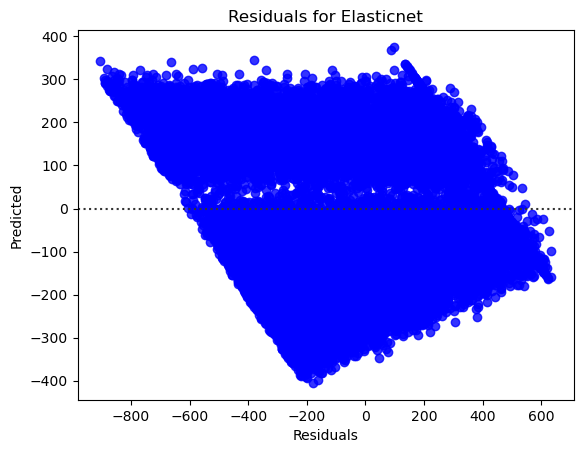

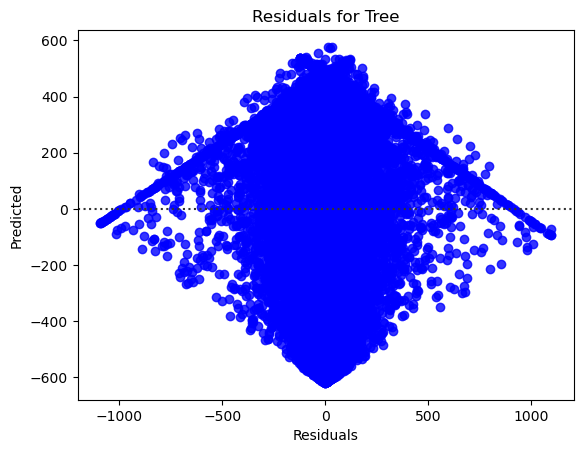

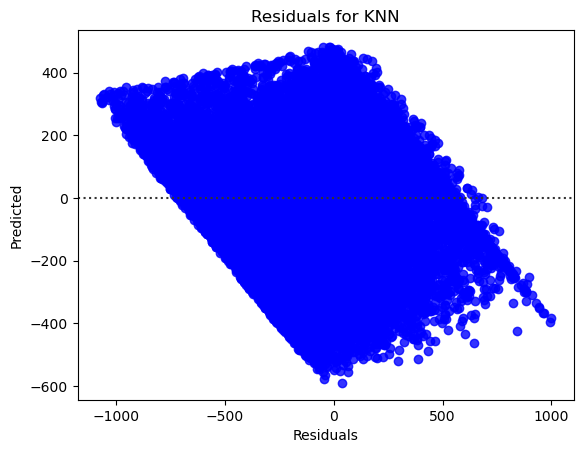

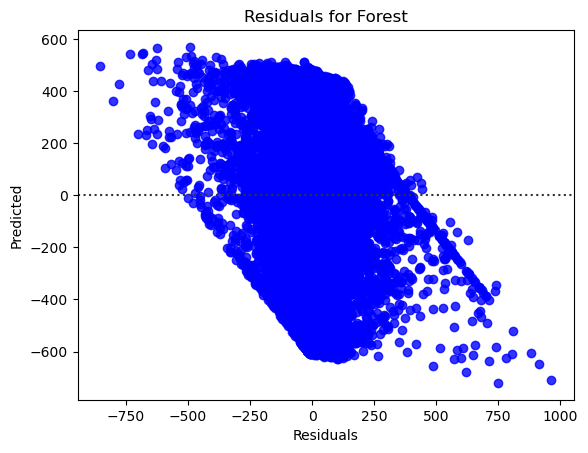

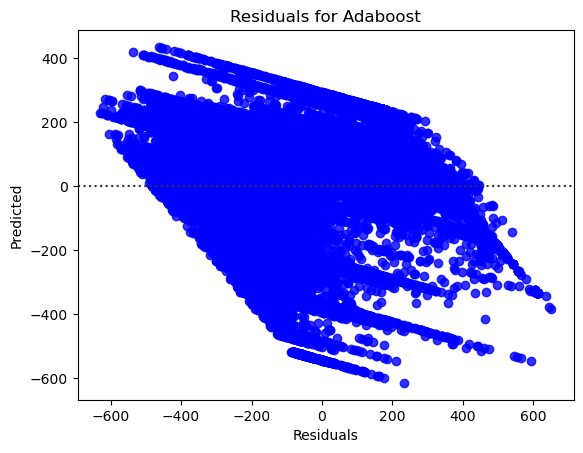

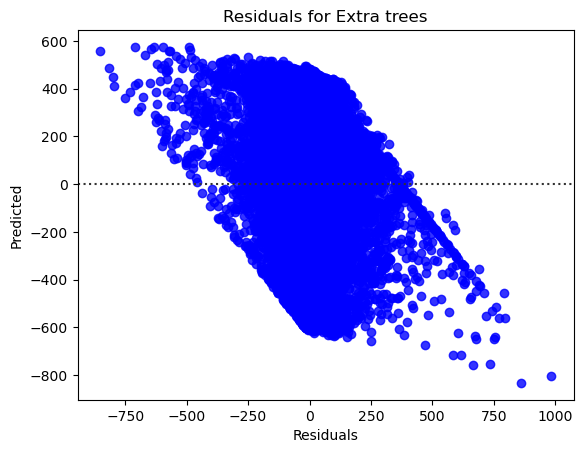

,R2,RMSE,MAE
Elasticnet_1,0.250090,330.001079,278.828142
Tree_1,0.800391,167.903858,98.329157
KNN_1,0.126918,357.042670,291.697168
Forest_1,0.900910,120.412572,79.672266
Adaboost_1,0.599012,242.883582,204.573026
Extra trees_1,0.906759,116.794008,78.849682


In [390]:
metrics_1 = evaluate(xtrain_1, ytrain_1, 1)
metrics_1

## Experiment 2

1. Missing values: Random sample inputer
2. Encoding: Target
3. Transformation: Sqrt
4. Outliers: None
5. Scaling: robust Scaler
6. Feature Selection: PermutationImportance

In [502]:
xtrain_2, ytrain_2 = xtrain.copy(), ytrain.copy()

In [503]:
def random_sample_imputer(dataframe):
    
    for column in dataframe:
        
        num_of_nans =  dataframe[column].isnull().sum()
        
        sample =  dataframe[column].dropna().sample(num_of_nans, replace = True)
        
        sample.index = dataframe.loc[dataframe[column].isnull(), column].index
        
        dataframe.loc[dataframe[column].isnull(), column] = sample
        
    return dataframe

func_random_sample_imputer = FunctionTransformer(random_sample_imputer)

In [504]:
encoder = TargetEncoder()

In [505]:
transformer = FunctionTransformer(np.sqrt)

In [506]:
scaler = RobustScaler()

In [507]:
num_columns = xtrain_2.select_dtypes('number').columns
cat_columns = xtrain_2.select_dtypes('O').columns





num_pipeline = Pipeline([
    
    ('imputer', func_random_sample_imputer),
    ('scaler', scaler),
    ('transformer', transformer),
    ('imputer_2', func_random_sample_imputer),


])

cat_pipeline = Pipeline([
   ('imputer', func_random_sample_imputer),
    ('encoder',TargetEncoder())
])


date_pipeline = Pipeline([
    ('date', func_date_transformer),
    ('imputer_2', SimpleImputer(strategy = 'median')),
  
])


preprocessing_pipeline = ColumnTransformer([
    ('num', num_pipeline, num_columns),
    ('cat', cat_pipeline, cat_columns),
    ('date', date_pipeline, date_cols)
], remainder = 'passthrough', verbose_feature_names_out = False)

xtrain_2 = preprocessing_pipeline.fit_transform(xtrain_2, ytrain_2)
xtrain_2.shape

(22844, 57)

In [513]:
# 6. Feature Selection: PermutationImportance

scoring = ['r2']

model = ExtraTreesRegressor()
model.fit(xtrain_2, ytrain_2)

r_multi = permutation_importance(model, xtrain_2, ytrain_2, scoring = scoring, random_state = 42)

In [527]:
selected_columns2 = [column for column, value in zip(xtrain_2.columns, r_multi['r2']['importances_mean']) if value > 0.000002]
f'{len(selected_columns2)} selected out of {len(xtrain_2. columns)}'

'47 selected out of 57'

In [528]:
xtrain_2 = xtrain_2[selected_columns2]

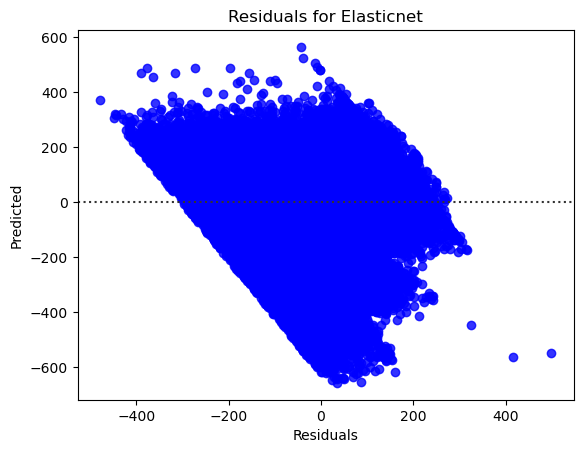

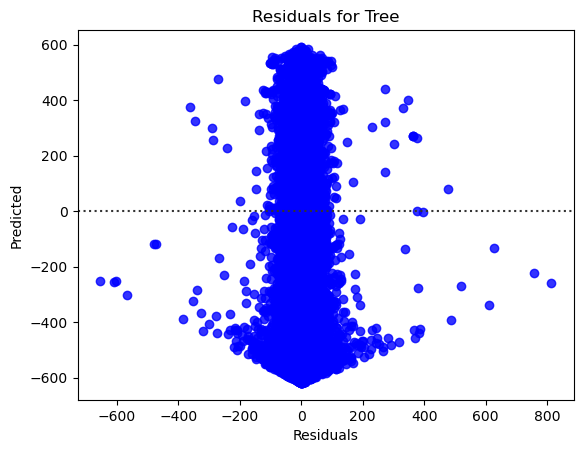

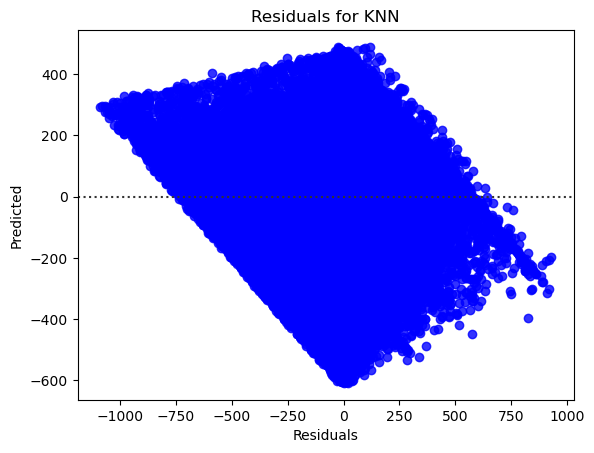

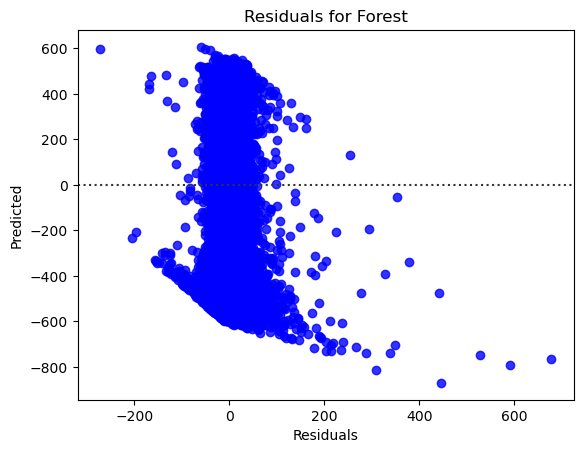

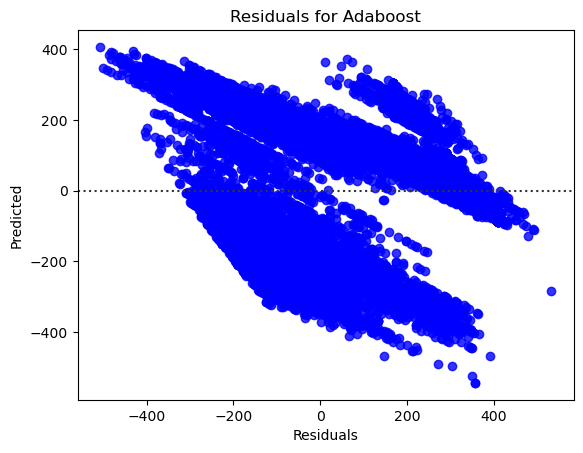

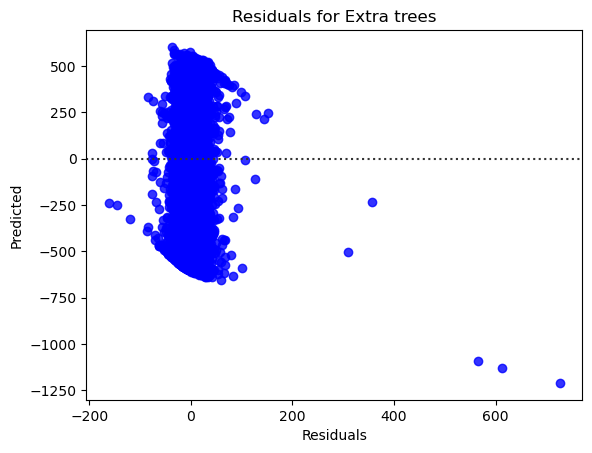

,R2,RMSE,MAE
Elasticnet_2,0.844687,150.194336,125.127824
Tree_2,0.991077,37.658937,19.668394
KNN_2,0.238883,331.121214,262.919362
Forest_2,0.996205,24.179694,14.381589
Adaboost_2,0.653204,220.730976,183.937901
Extra trees_2,0.998626,14.523068,9.034762


In [529]:
metrics_2 = evaluate(xtrain_2, ytrain_2, 2)
metrics_2

## Experiment 3

1. Missing values: SimpleImputer
2. Encoding: Ordinal
3. Transformation: Sqrt
4. Outliers: winsorize q97 to q97.5
5. Scaling: MinMaxScaler
6. Feature Selection: Tree based importance

In [534]:
xtrain_3, ytrain_3 = xtrain.copy(), ytrain.copy()

In [535]:
num_imputer = SimpleImputer(strategy = 'median')

cat_imputer = SimpleImputer(strategy = 'most_frequent')

In [536]:
encoder = OrdinalEncoder()

transformer = FunctionTransformer(np.sqrt)

scaler = MinMaxScaler()

In [538]:
num_columns = xtrain_3.select_dtypes('number').columns
cat_columns = xtrain_3.select_dtypes('O').columns





num_pipeline = Pipeline([
    
    ('imputer', num_imputer),
    ('scaler', scaler),
    ('transformer', transformer),
    ('winsorize', func_winsorize),
    ('imputer_2', num_imputer),

])

cat_pipeline = Pipeline([
    ('imputer', cat_imputer),
    ('encoder',encoder)
])


date_pipeline = Pipeline([
    ('date', func_date_transformer),
    ('imputer_2', num_imputer),
  
])


preprocessing_pipeline = ColumnTransformer([
    ('num', num_pipeline, num_columns),
    ('cat', cat_pipeline, cat_columns),
    ('date', date_pipeline, date_cols)
])

xtrain_3 = preprocessing_pipeline.fit_transform(xtrain_3)
xtrain_3.shape

(22844, 54)

In [539]:
# 6. Feature Selection: Tree based importance

model = RandomForestRegressor(oob_score = True)
model.fit(xtrain_3, ytrain_3)
model.oob_score_

0.9930705465776775

In [541]:
selected_column3 = [column for column, value in zip(xtrain_3.columns, model.feature_importances_) if value > 0.00005]
f'{len(selected_column3)} selected out of {len(xtrain_3.columns)}'

'43 selected out of 54'

In [542]:
xtrain_3 = xtrain_3[selected_column3]

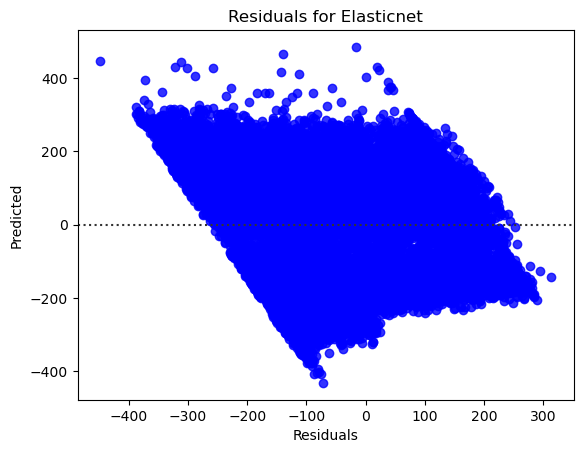

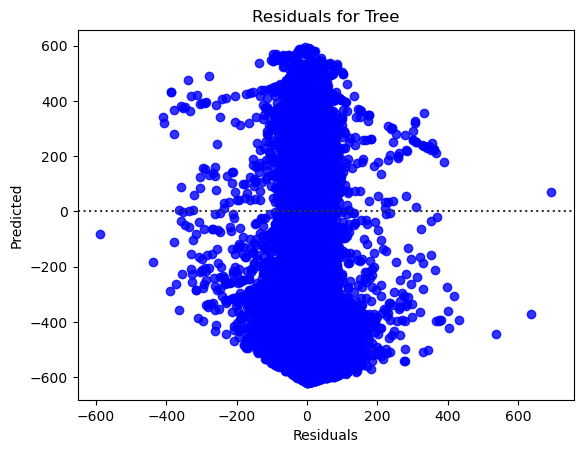

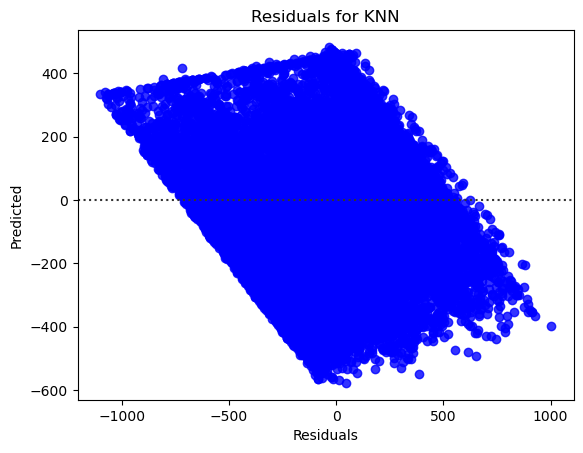

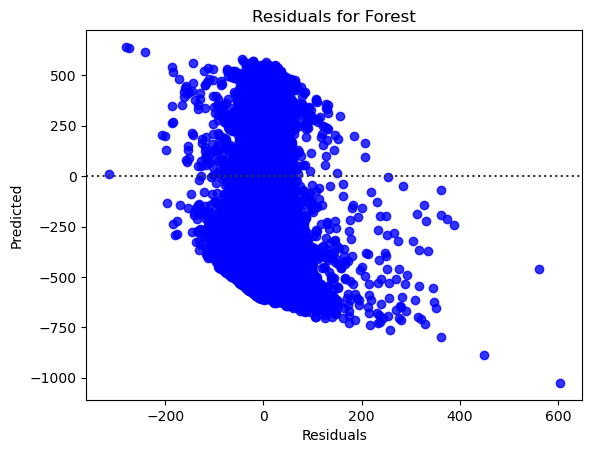

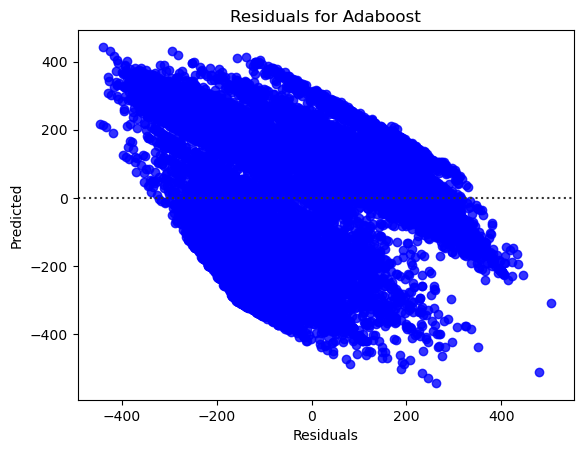

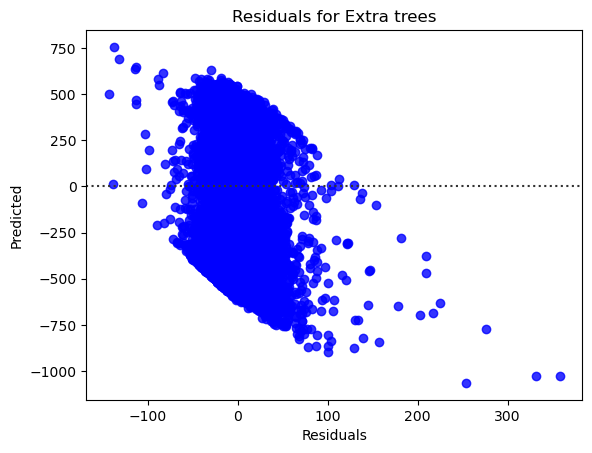

,R2,RMSE,MAE
Elasticnet_3,0.848866,148.135724,127.518417
Tree_3,0.983267,48.202935,27.603589
KNN_3,0.280582,323.842970,257.602396
Forest_3,0.991838,34.563660,19.778211
Adaboost_3,0.761033,188.467477,164.611515
Extra trees_3,0.997618,17.916768,12.144356


In [543]:
metrics_3 = evaluate(xtrain_3, ytrain_3, 3)
metrics_3

## Read Results

In [544]:
results = pd.concat([baseline,metrics_0, metrics_1, metrics_2, metrics_3,])

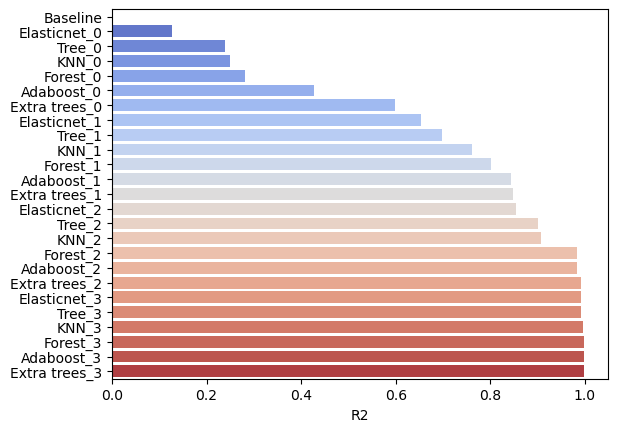

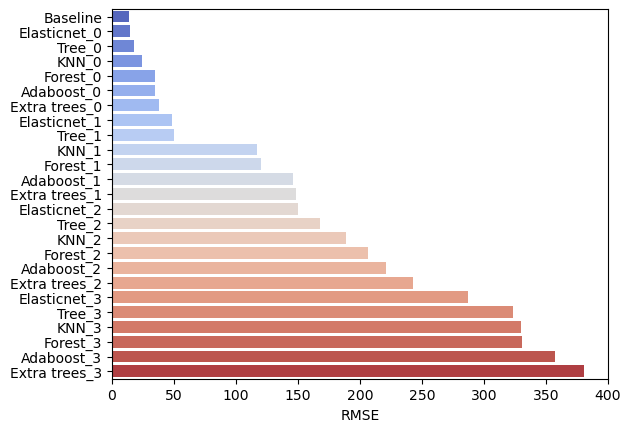

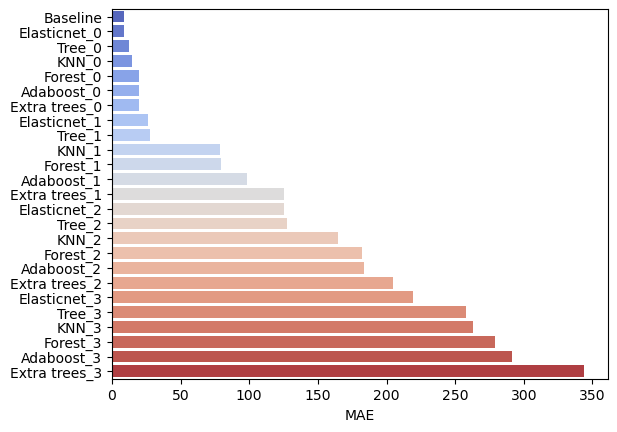

In [546]:
for metric in results.columns:
    
    plt.figure()
    
    sns.barplot(data = results.sort_values(by = metric), x = metric, y = results.index, palette = 'coolwarm')

## Traning Best Preprocessor

In [547]:
date_cols = ['ListingCreationDate', 'ClosedDate', 'DateCreditPulled', 'FirstRecordedCreditLine', 'LoanOriginationDate']
 

for column in date_cols:
    xtrain[column] = pd.to_datetime(xtrain[column])
    xvalidation[column] = pd.to_datetime(xvalidation[column])
    xtest[column] = pd.to_datetime(xtest[column])

In [548]:
num_imputer = SimpleImputer(strategy = 'median')

cat_imputer = SimpleImputer(strategy = 'most_frequent')

encoder = OrdinalEncoder()

transformer = FunctionTransformer(np.sqrt)

scaler = MinMaxScaler()

In [551]:
num_columns = xtrain.select_dtypes('number').columns
cat_columns = xtrain.select_dtypes('O').columns





num_pipeline = Pipeline([
    
    ('imputer', num_imputer),
    ('scaler', scaler),
    ('transformer', transformer),
    ('winsorize', func_winsorize),
    ('imputer_2', num_imputer),

])

cat_pipeline = Pipeline([
    ('imputer', cat_imputer),
    ('encoder',encoder)
])


date_pipeline = Pipeline([
    ('date', func_date_transformer),
    ('imputer_2', num_imputer),
  
])


preprocessing_pipeline = ColumnTransformer([
    ('num', num_pipeline, num_columns),
    ('cat', cat_pipeline, cat_columns),
    ('date', date_pipeline, date_cols)
])

xtrain = preprocessing_pipeline.fit_transform(xtrain)

xtest = preprocessing_pipeline.fit_transform(xtest)

xvalidation = preprocessing_pipeline.fit_transform(xvalidation)

xtrain.shape

(22844, 54)

In [552]:
## feature selection

xtrain = xtrain[selected_column3]

xvalidation = xvalidation[selected_column3]

xtest = xtest[selected_column3]

## Hyperparameter Tuning

In [553]:
param_grid = {
    'n_estimators': [50, 100, 200],               # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2'],     # Number of features to consider at each split
    'max_depth': [None, 10, 20, 30],               # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],               # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],                 # Minimum number of samples required to be at a leaf node
    'bootstrap': [True, False],                    # Whether bootstrap samples are used when building trees
    'random_state': [42]                           # Seed for reproducibility
}


In [559]:
model  = ExtraTreesRegressor()

random_search = RandomizedSearchCV(model, param_grid, cv = 5, scoring = 'r2').fit(xvalidation, yvalidation)

In [560]:
random_search.best_score_

0.9938581033562912

In [567]:
random_search.best_params_

{'random_state': 42,
 'n_estimators': 200,
 'min_samples_split': 2,
 'min_samples_leaf': 4,
 'max_features': 'auto',
 'max_depth': 20,
 'bootstrap': False}

## Model Training

In [572]:
model = ExtraTreesRegressor(random_state = 42,
                           n_estimators = 200,
                           min_samples_split = 2,
                           min_samples_leaf = 4,
                           max_features = 'auto',
                           max_depth = 20,
                           bootstrap = False
                           )

In [573]:
model.fit(xtrain, ytrain)

ExtraTreesRegressor(max_depth=20, max_features='auto', min_samples_leaf=4,
                    n_estimators=200, random_state=42)

In [574]:
# train_pred

In [576]:
train_pred = model.predict(xtrain)

In [581]:
def evaluate(ytrain, ypred, set_type = 'Train'):
    
    r2, rmse, mae = [], [], []


    cv = KFold(shuffle = True, n_splits = 3)

    r2_ = r2_score(ytrain, ypred)
    r2.append(r2_)

    rmse_= np.sqrt(mean_squared_error(ytrain, ypred))
    rmse.append(rmse_)

    mae_= mean_absolute_error(ytrain, ypred)
    mae.append(mae_)

    results = pd.DataFrame()

    results['Actual'] = ytrain

    results['Predicted'] = ypred

    results['Residuals'] = results['Actual'] - results['Predicted']

    results['Diff_%'] = np.abs((results['Residuals'] / results['Actual']) * 100)

    sns.residplot(x = results['Residuals'], y = results['Predicted'], color = 'blue');plt.show();

    return pd.DataFrame({
    'R2':r2,
    'RMSE': rmse,
    'MAE':mae
    }, index = [f'{set_type}'])

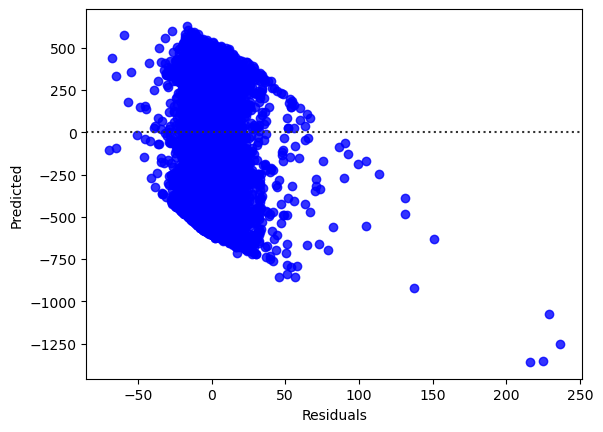

,R2,RMSE,MAE
Train,0.999404,9.302926,5.726279


In [582]:
evaluate(ytrain, train_pred, set_type = 'Train')

In [583]:
test_pred = model.predict(xtest)

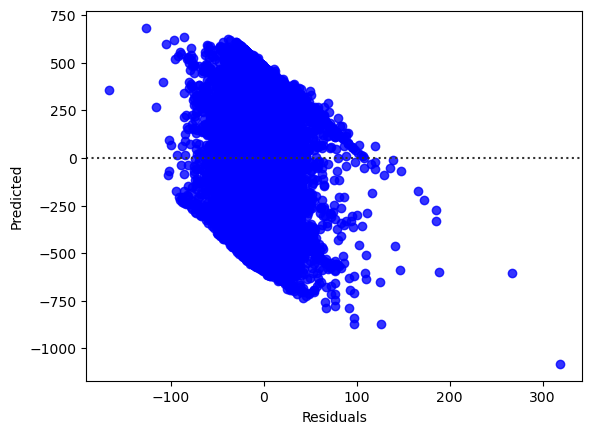

,R2,RMSE,MAE
Test,0.99218,33.660873,26.593042


In [584]:
evaluate(ytest, test_pred, set_type = 'Test')